In [1]:
!pip install piq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.9/106.9 kB 4.3 MB/s eta 0:00:00


In [2]:
import numpy as np
import os
import imageio
from skimage.transform import resize, rescale
import datetime
from glob import glob
import piq
import torch

import cv2
import matplotlib.pyplot as plt

In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
import tensorflow as tf
print(tf.__version__)
np.random.seed(30)
import random as rn
rn.seed(30)
from keras import backend as K
tf.random.set_seed(30)

2.19.0


In [5]:
DATASETS = {
    "Nighttime_Driving": r"/content/drive/MyDrive/Colab Notebooks/Dataset/nighttime_driving_dataset",
    "LoLI-Street": r"/content/drive/MyDrive/Colab Notebooks/Dataset/LoLI-Street Dataset/Train/low",
    "ExDark": r"/content/drive/MyDrive/Colab Notebooks/Dataset/ExDark"
}

In [6]:
def get_image_paths(root_dir):
    image_extensions = ["*.jpg", "*.jpeg", "*.png"]
    files = []
    for ext in image_extensions:
        files.extend(glob(os.path.join(root_dir, "**", ext), recursive=True))
    return files

In [7]:
from PIL import Image
import numpy as np

def get_dataset_summary(dataset_name, path):
    image_paths = get_image_paths(path)
    total_images = len(image_paths)

    # Gather few sample stats safely
    sample_sizes = []
    for p in image_paths[:10]:  # check only first 10 images
        try:
            with Image.open(p) as img:
                sample_sizes.append(img.size)  # (width, height)
        except:
            pass

    summary = {
        "dataset": dataset_name,
        "path": path,
        "total_images": total_images,
        "sample_resolutions": sample_sizes[:5]
    }
    return summary


In [8]:
dataset_summaries = []

for name, path in DATASETS.items():
    summary = get_dataset_summary(name, path)
    dataset_summaries.append(summary)

dataset_summaries

[{'dataset': 'Nighttime_Driving',
  'path': '/content/drive/MyDrive/Colab Notebooks/Dataset/nighttime_driving_dataset',
  'total_images': 400,
  'sample_resolutions': [(1080, 1300),
   (1080, 1280),
   (1080, 1300),
   (1080, 1280),
   (1080, 1280)]},
 {'dataset': 'LoLI-Street',
  'path': '/content/drive/MyDrive/Colab Notebooks/Dataset/LoLI-Street Dataset/Train/low',
  'total_images': 30000,
  'sample_resolutions': [(512, 512),
   (512, 512),
   (512, 512),
   (512, 512),
   (512, 512)]},
 {'dataset': 'ExDark',
  'path': '/content/drive/MyDrive/Colab Notebooks/Dataset/ExDark',
  'total_images': 6652,
  'sample_resolutions': [(332, 500),
   (508, 337),
   (382, 500),
   (306, 306),
   (500, 333)]}]

In [9]:
import os
from PIL import Image
import numpy as np

def get_dataset_summary(name, path):

    widths = []
    heights = []
    total_images = 0

    for root, dirs, files in os.walk(path):

        for file in files:

            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):

                img_path = os.path.join(root, file)

                try:
                    with Image.open(img_path) as img:
                        w, h = img.size
                        widths.append(w)
                        heights.append(h)
                        total_images += 1

                except:
                    continue

    if total_images == 0:
        return {
            "Dataset": name,
            "Total Images": 0,
            "Avg Width": "N/A",
            "Avg Height": "N/A",
            "Avg Resolution": "N/A"
        }

    avg_width = np.mean(widths)
    avg_height = np.mean(heights)

    return {
        "Dataset": name,
        "Total Images": total_images,
        "Avg Width": round(avg_width,2),
        "Avg Height": round(avg_height,2),
        "Avg Resolution": f"{int(avg_width)} x {int(avg_height)}"
    }

In [10]:
dataset_summaries = []

for name, path in DATASETS.items():
    summary = get_dataset_summary(name, path)
    dataset_summaries.append(summary)

dataset_summaries

[{'Dataset': 'Nighttime_Driving',
  'Total Images': 400,
  'Avg Width': np.float64(1080.0),
  'Avg Height': np.float64(1307.72),
  'Avg Resolution': '1080 x 1307'},
 {'Dataset': 'LoLI-Street',
  'Total Images': 30000,
  'Avg Width': np.float64(512.0),
  'Avg Height': np.float64(512.0),
  'Avg Resolution': '512 x 512'},
 {'Dataset': 'ExDark',
  'Total Images': 7319,
  'Avg Width': np.float64(822.18),
  'Avg Height': np.float64(652.01),
  'Avg Resolution': '822 x 652'}]

In [11]:
import pandas as pd

df = pd.DataFrame(dataset_summaries)
df

,Dataset,Total Images,Avg Width,Avg Height,Avg Resolution
0,Nighttime_Driving,400,1080.00,1307.72,1080 x 1307
1,LoLI-Street,30000,512.00,512.00,512 x 512
2,ExDark,7319,822.18,652.01,822 x 652


In [12]:
import os
import cv2
import numpy as np

def compute_avg_brightness(dataset_path):

    brightness_values = []

    for root, dirs, files in os.walk(dataset_path):

        for file in files:

            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):

                img_path = os.path.join(root, file)

                try:
                    img = cv2.imread(img_path)

                    if img is None:
                        continue

                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

                    brightness_values.append(gray.mean())

                except:
                    continue

    if len(brightness_values) == 0:
        return None

    return round(np.mean(brightness_values), 2)

In [13]:
dataset_brightness = {}

for name, path in DATASETS.items():
    dataset_brightness[name] = compute_avg_brightness(path)

dataset_brightness

{'Nighttime_Driving': np.float64(25.7),
 'LoLI-Street': np.float64(66.08),
 'ExDark': np.float64(37.05)}

In [14]:
def remove_corrupted_images(dataset_path):
    image_paths = get_image_paths(dataset_path)
    corrupted = []

    for img_path in image_paths:
        try:
            with Image.open(img_path) as img:
                img.verify()  # verify integrity
        except Exception:
            corrupted.append(img_path)
            os.remove(img_path)

    return corrupted

In [15]:
corrupted_files = {}

for name, path in DATASETS.items():
    corrupted_files[name] = remove_corrupted_images(path)

corrupted_files

{'Nighttime_Driving': [], 'LoLI-Street': [], 'ExDark': []}

In [16]:
def remove_small_images(dataset_path, min_width=256, min_height=256):
    image_paths = get_image_paths(dataset_path)
    removed = []

    for img_path in image_paths:
        try:
            with Image.open(img_path) as img:
                w, h = img.size
                if w < min_width or h < min_height:
                    removed.append(img_path)
                    os.remove(img_path)
        except:
            pass

    return removed

In [17]:
small_removed = {}

for name, path in DATASETS.items():
    small_removed[name] = remove_small_images(path)

small_removed

{'Nighttime_Driving': [], 'LoLI-Street': [], 'ExDark': []}

In [18]:
def remove_duplicate_images(dataset_path):
    image_paths = get_image_paths(dataset_path)
    seen_hashes = {}
    duplicates = []

    for img_path in image_paths:
        try:
            with Image.open(img_path) as img:
                img_bytes = img.tobytes()
                img_hash = hashlib.md5(img_bytes).hexdigest()

            if img_hash in seen_hashes:
                duplicates.append(img_path)
                os.remove(img_path)
            else:
                seen_hashes[img_hash] = img_path

        except:
            pass

    return duplicates


In [19]:
duplicate_files = {}

for name, path in DATASETS.items():
    duplicate_files[name] = remove_duplicate_images(path)

duplicate_files

{'Nighttime_Driving': [], 'LoLI-Street': [], 'ExDark': []}

In [20]:
def load_images(dataset_path, max_images=500):

    images = []

    for root, dirs, files in os.walk(dataset_path):
        for file in files:

            if file.lower().endswith(('.png','.jpg','.jpeg')):

                path = os.path.join(root, file)
                img = cv2.imread(path)

                if img is None:
                    continue

                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                images.append(img)

                if len(images) >= max_images:
                    return images

    return images

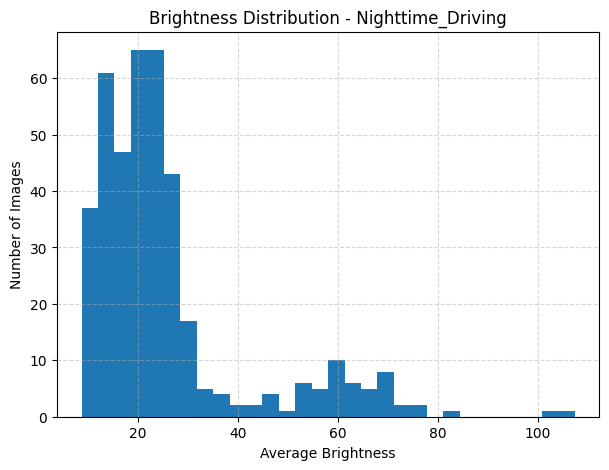

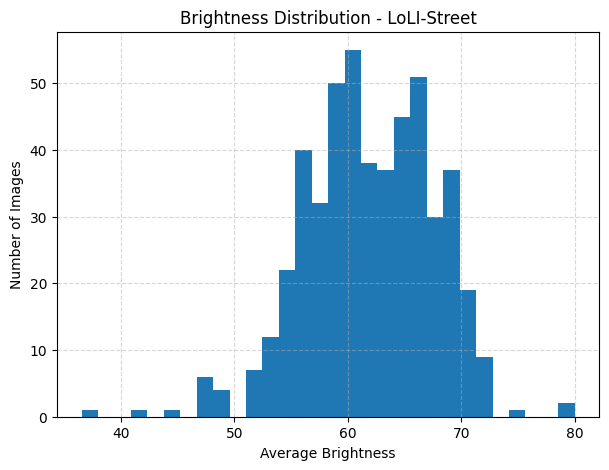

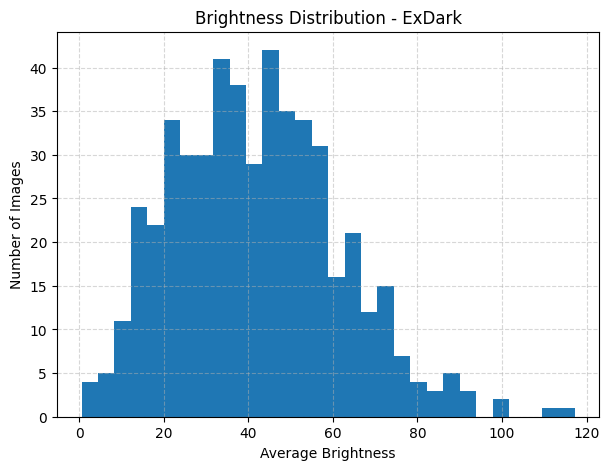

In [21]:
for name, path in DATASETS.items():

    images = load_images(path)

    brightness_values = []

    for img in images:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        brightness_values.append(gray.mean())

    plt.figure(figsize=(7,5))
    plt.hist(brightness_values, bins=30)
    plt.title(f"Brightness Distribution - {name}")
    plt.xlabel("Average Brightness")
    plt.ylabel("Number of Images")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

/tmp/ipykernel_27947/440639763.py:19: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(brightness_all, labels=labels)


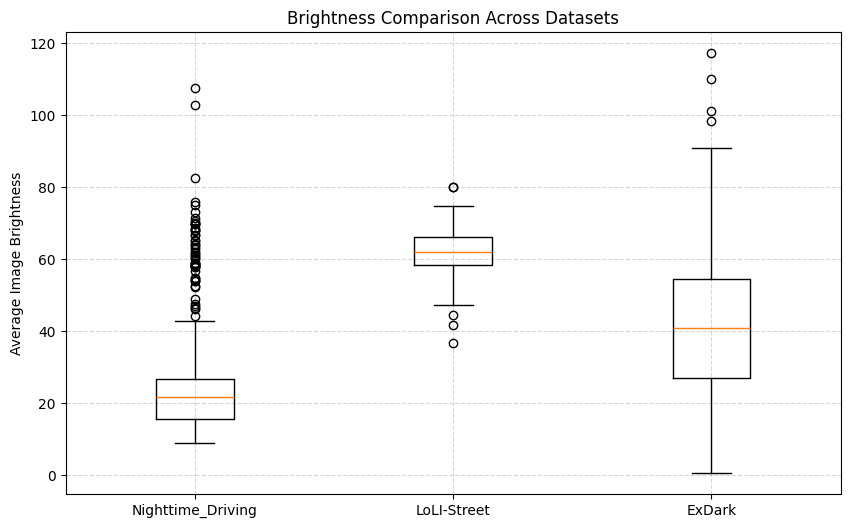

In [22]:
brightness_all = []

labels = []

for name, path in DATASETS.items():

    images = load_images(path)

    brightness = []

    for img in images:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        brightness.append(gray.mean())

    brightness_all.append(brightness)
    labels.append(name)

plt.figure(figsize=(10,6))
plt.boxplot(brightness_all, labels=labels)
plt.title("Brightness Comparison Across Datasets")
plt.ylabel("Average Image Brightness")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


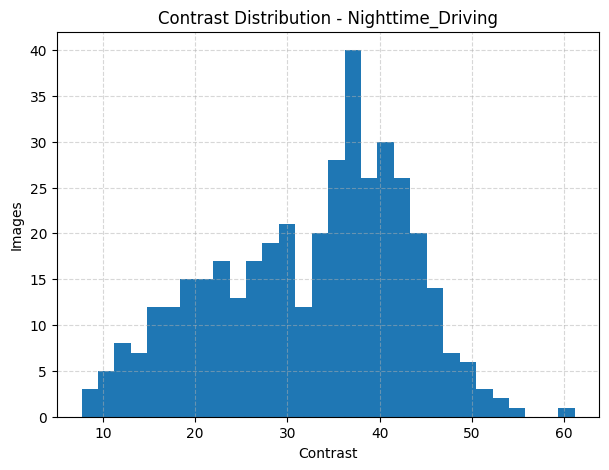

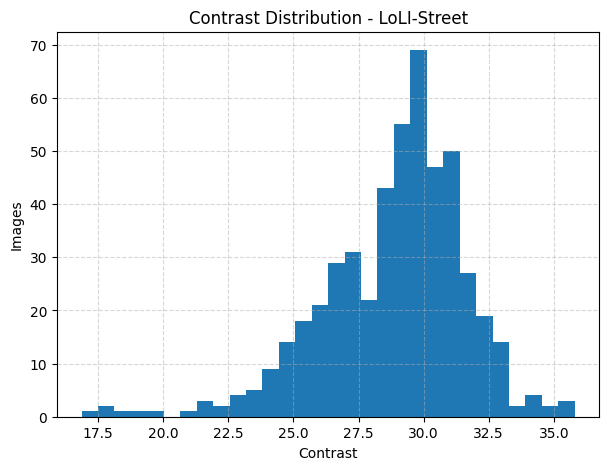

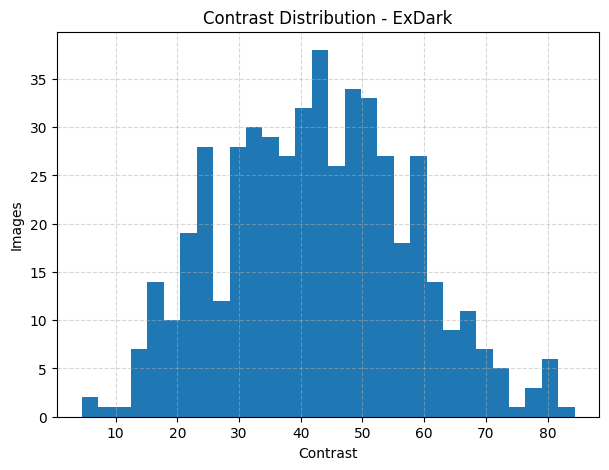

In [23]:
for name, path in DATASETS.items():

    images = load_images(path)

    contrast_values = []

    for img in images:

        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        contrast = gray.std()

        contrast_values.append(contrast)

    plt.figure(figsize=(7,5))

    plt.hist(contrast_values, bins=30)

    plt.title(f"Contrast Distribution - {name}")

    plt.xlabel("Contrast")

    plt.ylabel("Images")
    plt.grid(True, linestyle="--", alpha=0.5)

    plt.show()

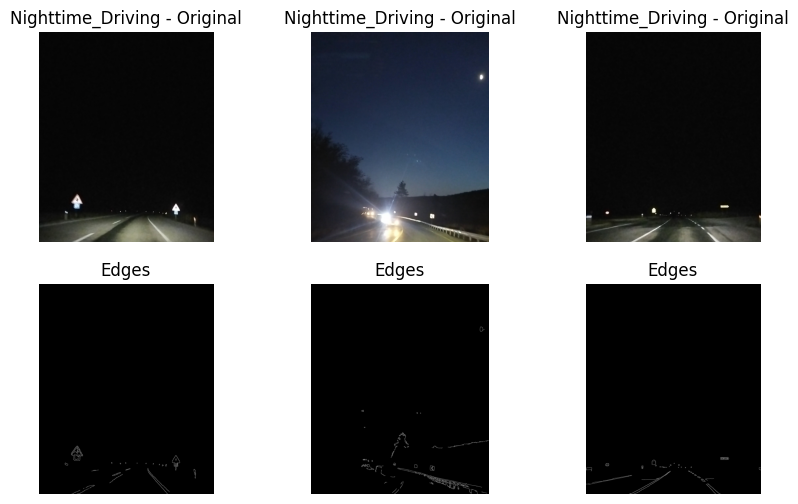

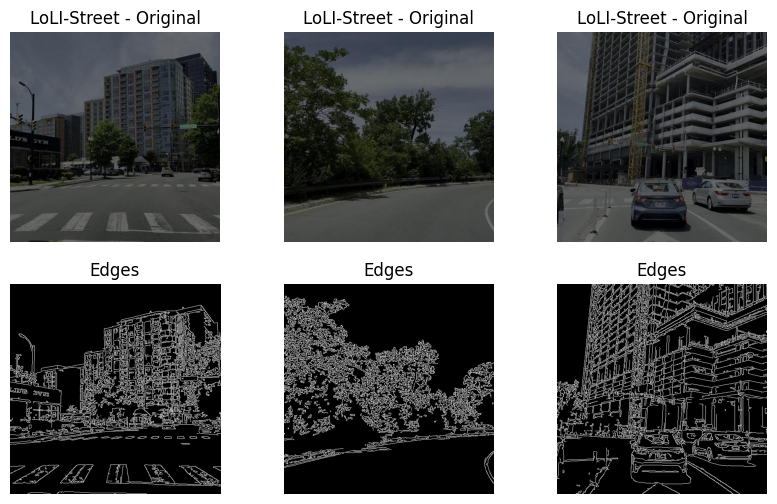

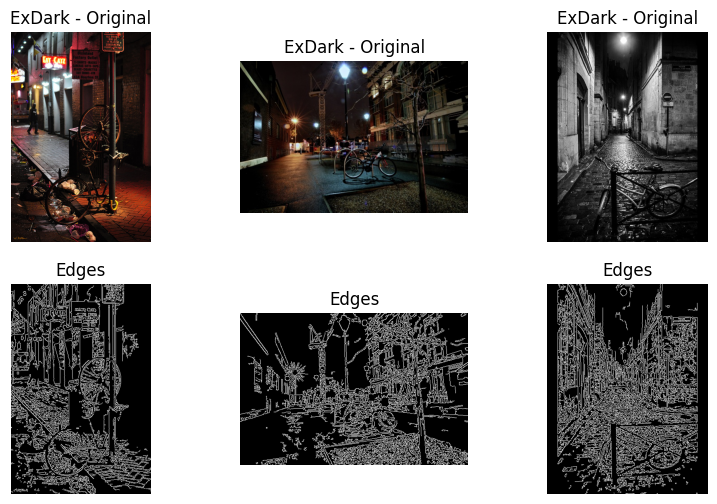

In [24]:
for name, path in DATASETS.items():

    images = load_images(path, max_images=3)

    plt.figure(figsize=(10,6))

    for i, img in enumerate(images):

        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        edges = cv2.Canny(gray, 50, 150)

        plt.subplot(2,3,i+1)
        plt.imshow(img)
        plt.title(f"{name} - Original")
        plt.axis("off")

        plt.subplot(2,3,i+4)
        plt.imshow(edges, cmap='gray')
        plt.title("Edges")
        plt.axis("off")

    plt.show()

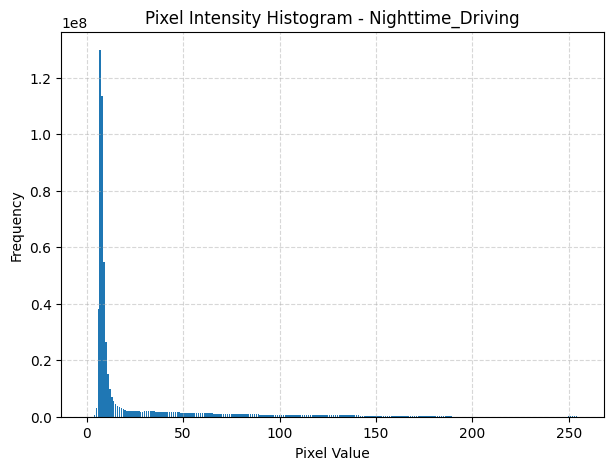

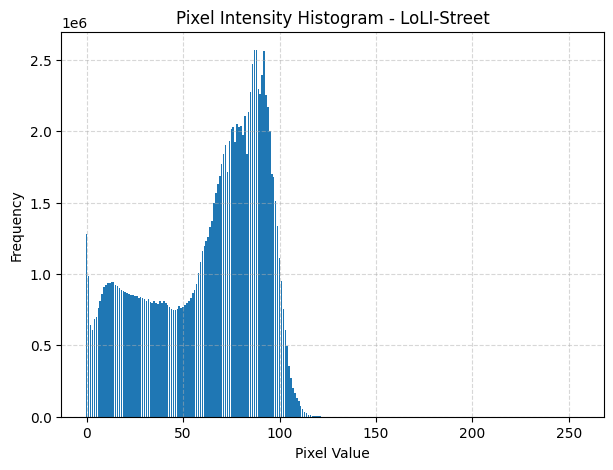

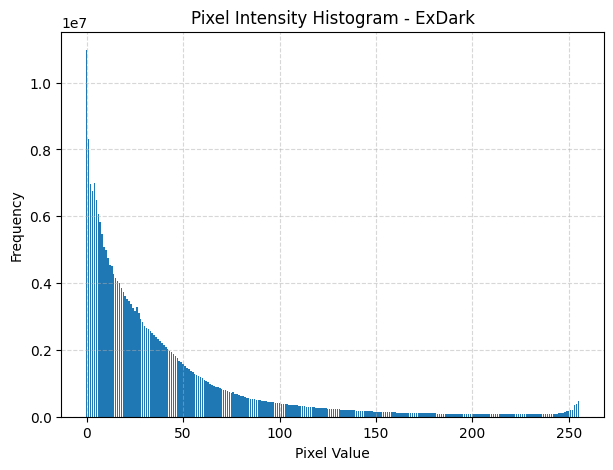

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

for name, path in DATASETS.items():

    images = load_images(path)

    hist = np.zeros(256)

    for img in images:

        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        h, _ = np.histogram(gray, bins=256, range=(0,256))

        hist += h

    plt.figure(figsize=(7,5))

    plt.bar(range(256), hist)

    plt.title(f"Pixel Intensity Histogram - {name}")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.grid(True, linestyle="--", alpha=0.5)

    plt.show()

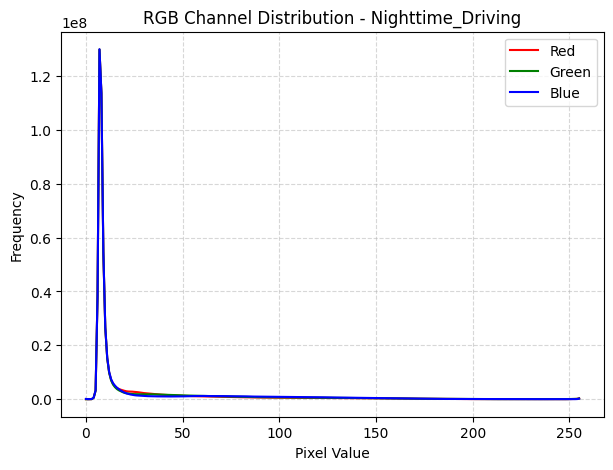

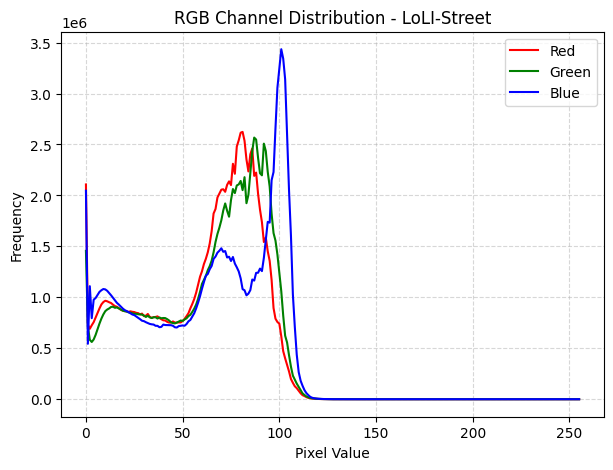

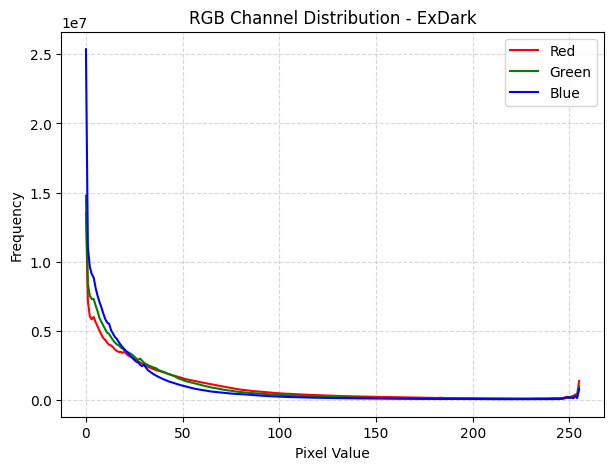

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

for name, path in DATASETS.items():

    images = load_images(path)

    r_hist = np.zeros(256)
    g_hist = np.zeros(256)
    b_hist = np.zeros(256)

    for img in images:

        r = img[:,:,0]
        g = img[:,:,1]
        b = img[:,:,2]

        r_hist += np.histogram(r, bins=256, range=(0,256))[0]
        g_hist += np.histogram(g, bins=256, range=(0,256))[0]
        b_hist += np.histogram(b, bins=256, range=(0,256))[0]

    plt.figure(figsize=(7,5))

    plt.plot(r_hist, color='red', label='Red')
    plt.plot(g_hist, color='green', label='Green')
    plt.plot(b_hist, color='blue', label='Blue')

    plt.title(f"RGB Channel Distribution - {name}")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend()

    plt.show()

In [27]:
def resize_image(img, size=(256, 256)):
    return cv2.resize(img, size, interpolation=cv2.INTER_AREA)


In [28]:
def normalize_image(img):
    return img.astype(np.float32) / 255.0

In [29]:
def gamma_correction(img, gamma=0.6):
    inv_gamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** inv_gamma * 255
                      for i in np.arange(256)]).astype("uint8")
    return cv2.LUT(img, table)



In [30]:
def denoise_image(img):
    return cv2.bilateralFilter(img, d=7, sigmaColor=50, sigmaSpace=50)


In [31]:
def preprocess_image(img_path, size=(256, 256), gamma=0.6):
    img = cv2.imread(img_path)

    if img is None:
        return None

    # 1. Resize
    img = resize_image(img, size)

    # 2. Gamma correction (brighten)
    img = gamma_correction(img, gamma)

    # 3. Noise reduction
    img = denoise_image(img)

    # 4. Normalize 0–1
    img = normalize_image(img)

    return img


In [32]:
def preprocess_dataset(dataset_path, output_dir, size=(256, 256), gamma=0.6):
    os.makedirs(output_dir, exist_ok=True)
    image_paths = get_image_paths(dataset_path)

    for img_path in image_paths:
        img = preprocess_image(img_path, size=size, gamma=gamma)
        if img is None:
            continue

        # convert back to uint8 for saving (0–255)
        img_uint8 = (img * 255).astype(np.uint8)

        # maintain name
        filename = os.path.basename(img_path)
        save_path = os.path.join(output_dir, filename)

        cv2.imwrite(save_path, img_uint8)


In [34]:
# for name, path in DATASETS.items():
#     out = f"/content/drive/MyDrive/Colab Notebooks/preprocessed/{name}/"
#     preprocess_dataset(path, out, size=(256, 256), gamma=0.6)


In [35]:
IMG_SIZE = (256, 256)

In [36]:
def load_and_preprocess(path):
    # Read the image file
    img = tf.io.read_file(path)

    # Decode image (supports JPG, PNG)
    img = tf.image.decode_image(img, channels=3)
    img.set_shape([None, None, 3])

    # Resize image
    img = tf.image.resize(img, IMG_SIZE)

    # Normalize to [0,1]
    img = img / 255.0

    return img


In [37]:
import glob
DATA_DIR = "/content/drive/MyDrive/Colab Notebooks/preprocessed"

all_clean_image_paths = []
for ext in ("*.jpg", "*.jpeg", "*.png"):
    all_clean_image_paths.extend(
        glob.glob(os.path.join(DATA_DIR, "**", ext), recursive=True)
    )

len(all_clean_image_paths)



37097

In [38]:
import tensorflow as tf

def load_and_preprocess(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, (256, 256))
    img = tf.cast(img, tf.float32) / 255.0
    return img

ds = tf.data.Dataset.from_tensor_slices(all_clean_image_paths)
ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
ds = ds.batch(3)


In [39]:
sample_batch = ds.take(1)

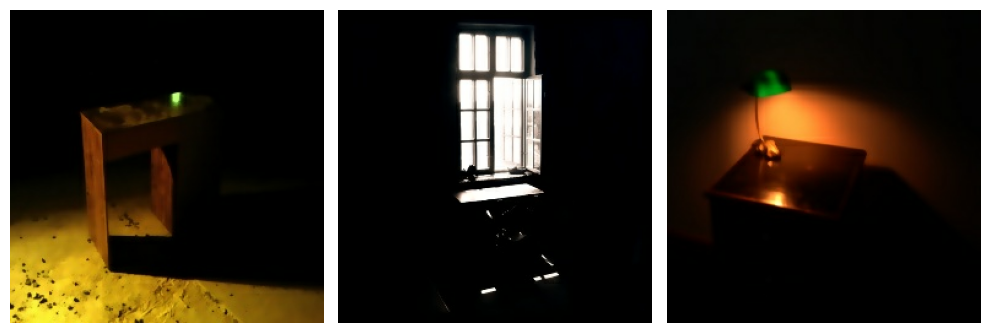

In [40]:
import matplotlib.pyplot as plt

def show_batch(batch):
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(batch):
        plt.subplot(3, 3, i + 1)
        plt.imshow(img.numpy())
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Extract first batch
for batch in sample_batch:
    show_batch(batch)
    break

In [41]:
import tensorflow as tf
import matplotlib.pyplot as plt

In [42]:
import tensorflow as tf
import math

def gaussian_kernel(size, sigma):
    """Creates a 2D Gaussian kernel."""
    ax = tf.range(-size // 2 + 1, size // 2 + 1, dtype=tf.float32)
    xx, yy = tf.meshgrid(ax, ax)
    kernel = tf.exp(-(xx**2 + yy**2) / (2.0 * sigma**2))
    kernel = kernel / tf.reduce_sum(kernel)
    return kernel


def gaussian_blur(img, sigma):
    """
    img must be (B, H, W, 1)
    """

    tf.debugging.assert_rank(img, 4, message="gaussian_blur expects 4D input")

    kernel_size = int(6 * sigma + 1)
    if kernel_size % 2 == 0:
        kernel_size += 1

    kernel = gaussian_kernel(kernel_size, sigma)
    kernel = kernel[:, :, tf.newaxis, tf.newaxis]

    return tf.nn.depthwise_conv2d(
        img,
        kernel,
        strides=[1, 1, 1, 1],
        padding="SAME"
    )


In [43]:
def estimate_illumination(luma, sigma=15):
    """
    luma: (B, H, W, 1) OR (H, W, 1)
    returns: (B, H, W, 1)
    """

    # ✅ Ensure batch dimension
    if luma.shape.rank == 3:
        luma = tf.expand_dims(luma, axis=0)  # (1, H, W, 1)

    # Downsample
    small = tf.image.resize(luma, (64, 64))

    # Blur
    illum_small = gaussian_blur(small, sigma)

    # Upsample back
    illum = tf.image.resize(
        illum_small,
        tf.shape(luma)[1:3]
    )

    return illum


In [44]:
def percentile(x, q):
    x = tf.reshape(x, [-1])
    k = tf.cast(tf.round(q / 100.0 * tf.cast(tf.size(x), tf.float32)), tf.int32)
    x = tf.sort(x)
    return x[k]


In [45]:
def retinex_enhancement(img, sigmas=(15,), gamma=0.8, eps=1e-4):

    img = tf.clip_by_value(img, eps, 1.0)

    luma = tf.reduce_max(img, axis=-1, keepdims=True)

    illum_maps = []
    for sigma in sigmas:
        illum = estimate_illumination(luma, sigma)
        illum_maps.append(illum)

    illumination = tf.reduce_mean(tf.stack(illum_maps), axis=0)
    illumination = tf.clip_by_value(illumination, eps, 1.0)

    reflectance = img / (illumination + eps)
    reflectance = tf.clip_by_value(reflectance, 0.0, 1.0)

    enhanced = reflectance * tf.pow(illumination, gamma)
    enhanced = tf.clip_by_value(enhanced, 0.0, 1.0)

    return enhanced, reflectance, illumination

In [46]:
def visualize_retinex(dataset):
    for batch in dataset.take(1):
        plt.figure(figsize=(12, 6))

        for i in range(3):
            # Original
            plt.subplot(2, 3, i + 1)
            plt.imshow(batch[i])
            plt.title("Original")
            plt.axis("off")

            # 🔧 ADD batch dimension
            img = tf.expand_dims(batch[i], axis=0)   # (1, H, W, 3)

            enhanced, _, _ = retinex_enhancement(img)

            # 🔧 REMOVE batch dimension
            enhanced_img = enhanced[0]               # (H, W, 3)

            plt.subplot(2, 3, i + 4)
            plt.imshow(tf.pow(enhanced_img, 1/2.2))  # gamma for display
            plt.title("Retinex Enhanced")
            plt.axis("off")

        plt.tight_layout()
        plt.show()
        break


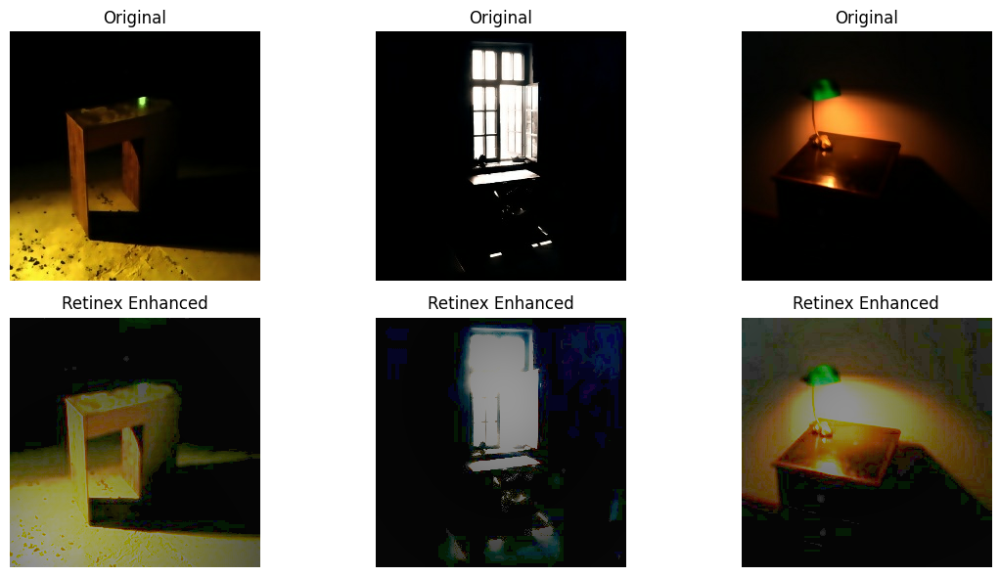

In [47]:
visualize_retinex(ds)

In [48]:
def retinex_map(img):
    enhanced, _, illum = retinex_enhancement(img)
    return enhanced, illum


In [49]:
def flatten_sequence(x):
    return tf.data.Dataset.from_tensor_slices((x))


In [50]:

train_ds = (
    ds
    .flat_map(flatten_sequence)
    .batch(4)
    .prefetch(tf.data.AUTOTUNE)
)


In [51]:
import tensorflow as tf
from tensorflow.keras import layers
def channel_attention(x, reduction=8):
    channels = x.shape[-1]

    avg_pool = layers.GlobalAveragePooling2D()(x)
    max_pool = layers.GlobalMaxPooling2D()(x)

    shared_dense_1 = layers.Dense(
        channels // reduction,
        activation="relu",
        kernel_initializer="he_normal"
    )

    shared_dense_2 = layers.Dense(
        channels,
        kernel_initializer="he_normal"
    )

    avg_out = shared_dense_2(shared_dense_1(avg_pool))
    max_out = shared_dense_2(shared_dense_1(max_pool))

    scale = layers.Add()([avg_out, max_out])
    scale = layers.Activation("sigmoid")(scale)

    scale = layers.Reshape((1, 1, channels))(scale)

    # Slight residual scaling to prevent over-suppression
    scale = layers.Lambda(lambda t: 0.5 + 0.5 * t)(scale)

    return layers.Multiply()([x, scale])


def spatial_attention(x):
    avg_pool = layers.Lambda(lambda z: tf.reduce_mean(z, axis=-1, keepdims=True))(x)
    max_pool = layers.Lambda(lambda z: tf.reduce_max(z, axis=-1, keepdims=True))(x)

    concat = layers.Concatenate(axis=-1)([avg_pool, max_pool])

    scale = layers.Conv2D(
        1,
        kernel_size=7,
        padding="same",
        activation="sigmoid",
        kernel_initializer="he_normal"
    )(concat)

    # residual scaling
    scale = layers.Lambda(lambda t: 0.5 + 0.5 * t)(scale)

    return layers.Multiply()([x, scale])


def IAM(x):
    # Try spatial first for LLIE
    x = spatial_attention(x)
    x = channel_attention(x)
    return x

In [52]:
def ASPP(x, filters=256):

    shape = x.shape

    y1 = layers.Conv2D(filters, 1, padding="same", activation="relu")(x)

    y2 = layers.Conv2D(filters, 3, dilation_rate=3,
                       padding="same", activation="relu")(x)

    y3 = layers.Conv2D(filters, 3, dilation_rate=6,
                       padding="same", activation="relu")(x)

    y4 = layers.Conv2D(filters, 3, dilation_rate=9,
                       padding="same", activation="relu")(x)

    y = layers.Concatenate()([y1, y2, y3, y4])

    y = layers.Conv2D(filters, 1, padding="same", activation="relu")(y)

    return y



In [53]:
from tensorflow.keras import Model, Input
def conv_block(x, filters):
    shortcut = x

    x = layers.Conv2D(filters, (3,3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.05)(x)

    x = layers.Conv2D(filters, (3,3), padding='same')(x)
    x = layers.BatchNormalization()(x)

    # Match dimensions if needed
    if shortcut.shape[-1] != filters:
        shortcut = layers.Conv2D(filters, (1,1), padding='same')(shortcut)

    x = layers.Add()([x, shortcut])
    x = layers.LeakyReLU(alpha=0.05)(x)

    return x

def downsample_block(x, filters):
    x = layers.Conv2D(filters, 3, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    return x


def build_unet_iam(input_shape=(256, 256, 3)):
    inputs = Input(shape=input_shape)

    # Encoder
    c1 = conv_block(inputs, 32)
    p1 = downsample_block(c1, 64)

    c2 = conv_block(p1, 64)
    p2 = downsample_block(c2, 128)

    c3 = conv_block(p2, 128)
    p3 = downsample_block(c3, 256)

    # Bottleneck
    bn = conv_block(p3, 256)
    bn = ASPP(bn)   # multi-scale context

    # Decoder with gated skip
    u3 = layers.UpSampling2D()(bn)
    gated_c3 = IAM(c3)
    u3 = layers.Concatenate()([u3, gated_c3])
    c4 = conv_block(u3, 128)

    u2 = layers.UpSampling2D()(c4)
    gated_c2 = IAM(c2)
    u2 = layers.Concatenate()([u2, gated_c2])
    c5 = conv_block(u2, 64)

    u1 = layers.UpSampling2D()(c5)
    gated_c1 = IAM(c1)
    u1 = layers.Concatenate()([u1, gated_c1])
    c6 = conv_block(u1, 32)

    outputs = layers.Conv2D(3, (1, 1), activation='tanh', kernel_initializer='zeros')(c6)

    return Model(inputs, outputs)


In [54]:
unet_iam = build_unet_iam()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [55]:
def local_exposure_loss(img, target=0.45):

    patch_mean = tf.nn.avg_pool2d(
        img,
        ksize=32,
        strides=8,
        padding='VALID'
    )

    return tf.reduce_mean((patch_mean - target) ** 2)

In [56]:

def color_loss(img):
    mean_rgb = tf.reduce_mean(img, axis=[1,2])
    r,g,b = tf.split(mean_rgb,3,axis=1)

    loss = tf.square(r-g) + tf.square(r-b) + tf.square(g-b)
    return tf.reduce_mean(loss)


def edge_aware_smoothness_loss(gain, input_img):

    if input_img.shape[-1] == 3:
        input_img = tf.image.rgb_to_grayscale(input_img)


    gx, gy = tf.image.image_gradients(gain)
    ix, iy = tf.image.image_gradients(input_img)


    weight_x = tf.exp(-10.0 * tf.abs(ix))
    weight_y = tf.exp(-10.0 * tf.abs(iy))


    loss = tf.reduce_mean(weight_x * tf.abs(gx)) + tf.reduce_mean(weight_y * tf.abs(gy))

    return loss


In [57]:
def structure_loss(illum, input_img):
    grad_illum_x = tf.abs(illum[:, :, 1:, :] - illum[:, :, :-1, :])
    grad_input_x = tf.abs(input_img[:, :, 1:, :] - input_img[:, :, :-1, :])

    grad_illum_y = tf.abs(illum[:, 1:, :, :] - illum[:, :-1, :, :])
    grad_input_y = tf.abs(input_img[:, 1:, :, :] - input_img[:, :-1, :, :])

    weight_x = tf.exp(-10 * grad_input_x)
    weight_y = tf.exp(-10 * grad_input_y)

    loss_x = tf.reduce_mean(weight_x * grad_illum_x)
    loss_y = tf.reduce_mean(weight_y * grad_illum_y)

    return loss_x + loss_y

In [58]:
iam_opt = tf.keras.optimizers.Adam(2e-4)

@tf.function
def train_step_illumination(low_light):

    with tf.GradientTape() as tape:

        enhanced_init, _, _ = retinex_enhancement(low_light)

        gain_map = unet_iam(low_light, training=True)
        gain_map = tf.clip_by_value(gain_map, 0.0, 1.0)

        correction = 0.8 + 3.0 * (gain_map - 0.5)

        enhanced = enhanced_init * correction
        enhanced = tf.clip_by_value(enhanced, 1e-4, 1.0)

        gamma = tf.clip_by_value(1.2 - 0.5 * gain_map, 0.8, 1.4)

        enhanced = tf.pow(enhanced + 1e-6, gamma)
        enhanced = tf.clip_by_value(enhanced, 0.0, 1.0)

        contrast_loss = tf.nn.relu(0.15 - tf.math.reduce_std(enhanced))




        exp_loss = local_exposure_loss(enhanced, target=0.45)
        smooth_loss = edge_aware_smoothness_loss(gain_map,enhanced_init)

        gx, gy = tf.image.image_gradients(gain_map)
        ix, iy = tf.image.image_gradients(tf.image.rgb_to_grayscale(enhanced_init))

        struct_loss = tf.reduce_mean(tf.abs(gx) * tf.exp(-10.0 * tf.abs(ix)) + tf.abs(gy) * tf.exp(-10.0 * tf.abs(iy)))

        hx, hy = tf.image.image_gradients(enhanced)
        ox, oy = tf.image.image_gradients(low_light)

        detail_loss = tf.reduce_mean(tf.abs(hx - ox) + tf.abs(hy - oy))
        gain_reg = tf.reduce_mean(tf.abs(gain_map - 0.5))

        total_loss = (
            2.0 * exp_loss +
            0.4 * smooth_loss +
            0.2 * contrast_loss +
            0.4 * struct_loss +
            0.2 * detail_loss +
            0.2 * gain_reg +
            0.2 * color_loss(enhanced)
        )


    grads = tape.gradient(total_loss, unet_iam.trainable_variables)
    grads = [tf.clip_by_norm(g, 5.0) for g in grads]
    iam_opt.apply_gradients(zip(grads, unet_iam.trainable_variables))

    return total_loss





In [59]:
import matplotlib.pyplot as plt

def save_progress_images(model, sample, epoch):

    pred = model(sample, training=False)

    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)
    plt.title("Input")
    plt.imshow(sample[0])
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title(f"Output Epoch {epoch}")
    plt.imshow(pred[0])
    plt.axis("off")

    plt.savefig(f"progress_epoch_{epoch}.png", dpi=300)
    plt.close()

In [60]:
def plot_progress(low_light_sample, step, epoch):

    enhanced_init, _, _ = retinex_enhancement(low_light_sample)
    gain_map = unet_iam(low_light_sample, training=True)
    gain_map = tf.clip_by_value(gain_map, 0.0, 1.0)
    correction = 0.8 + 3.0 * (gain_map - 0.5)
    enhanced = enhanced_init * correction
    enhanced = tf.clip_by_value(enhanced, 1e-4, 1.0)

    gamma = tf.clip_by_value(1.2 - 0.5 * gain_map, 0.8, 1.4)

    enhanced = tf.pow(enhanced + 1e-6, gamma)
    enhanced = tf.clip_by_value(enhanced, 0.0, 1.0)

    import matplotlib.pyplot as plt
    plt.figure(figsize=(12, 4))
    plt.suptitle(f'Epoch {epoch+1}', fontsize=14)

    titles = ['Input', 'Gain Map (IAM)', 'Enhanced Output']
    imgs = [low_light_sample[0], gain_map[0], enhanced[0]]

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(titles[i])
        plt.imshow(imgs[i])
        plt.axis('off')

    plt.show()


--- Starting Epoch 1 ---
Epoch 1 | Step 0: Loss = 0.5378
Epoch 1 | Step 100: Loss = 0.3160
Epoch 1 | Step 200: Loss = 0.2883
Epoch 1 | Step 300: Loss = 0.3646
Epoch 1 | Step 400: Loss = 0.3621
Epoch 1 completed in 135.42 seconds
Epoch 1 Average Loss: 0.3207

Visualizing results after Epoch 1


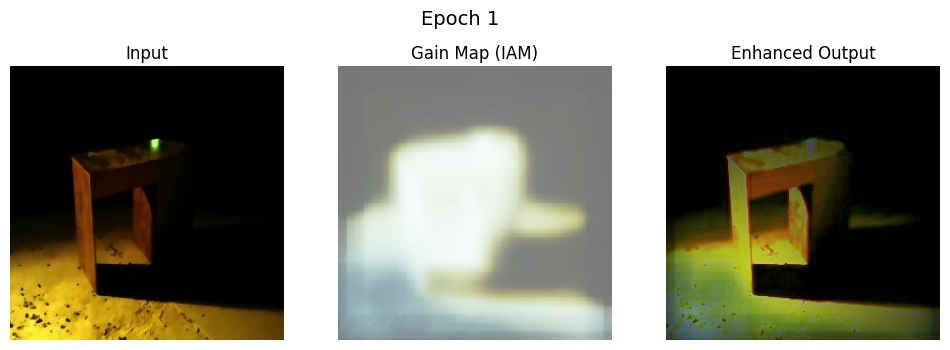

Saved checkpoint for epoch 1: ./training_checkpoints/ckpt-1

--- Starting Epoch 2 ---
Epoch 2 | Step 0: Loss = 0.3305
Epoch 2 | Step 100: Loss = 0.3094
Epoch 2 | Step 200: Loss = 0.2815
Epoch 2 | Step 300: Loss = 0.3608
Epoch 2 | Step 400: Loss = 0.3583
Epoch 2 completed in 26.49 seconds
Epoch 2 Average Loss: 0.3072

Visualizing results after Epoch 2


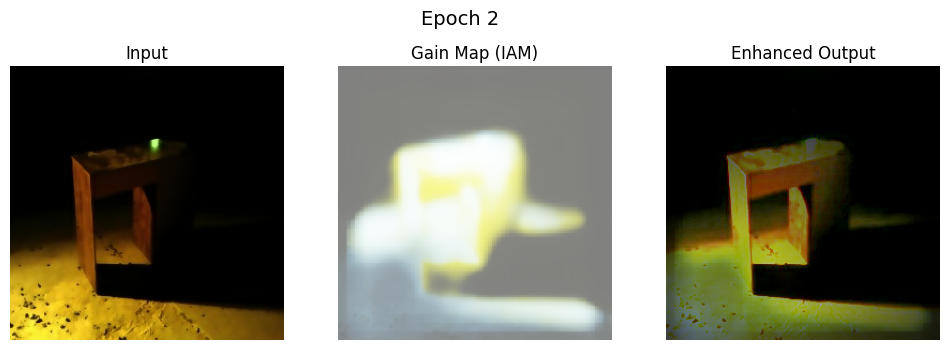

Saved checkpoint for epoch 2: ./training_checkpoints/ckpt-2

--- Starting Epoch 3 ---
Epoch 3 | Step 0: Loss = 0.3249
Epoch 3 | Step 100: Loss = 0.3079
Epoch 3 | Step 200: Loss = 0.2784
Epoch 3 | Step 300: Loss = 0.3606
Epoch 3 | Step 400: Loss = 0.3570
Epoch 3 completed in 26.52 seconds
Epoch 3 Average Loss: 0.3049

Visualizing results after Epoch 3


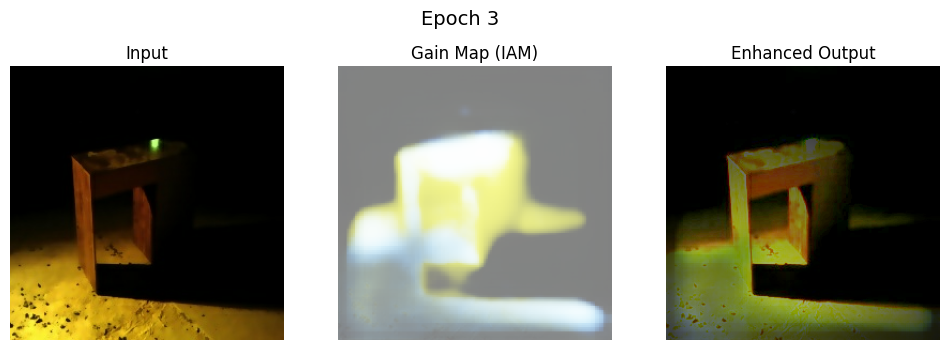

Saved checkpoint for epoch 3: ./training_checkpoints/ckpt-3

--- Starting Epoch 4 ---
Epoch 4 | Step 0: Loss = 0.3234
Epoch 4 | Step 100: Loss = 0.3079
Epoch 4 | Step 200: Loss = 0.2777
Epoch 4 | Step 300: Loss = 0.3591
Epoch 4 | Step 400: Loss = 0.3602
Epoch 4 completed in 26.51 seconds
Epoch 4 Average Loss: 0.3037

Visualizing results after Epoch 4


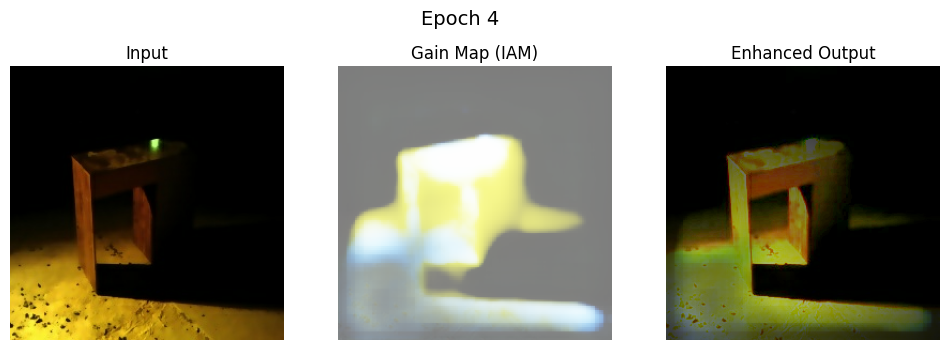

Saved checkpoint for epoch 4: ./training_checkpoints/ckpt-4

--- Starting Epoch 5 ---
Epoch 5 | Step 0: Loss = 0.3226
Epoch 5 | Step 100: Loss = 0.3070
Epoch 5 | Step 200: Loss = 0.2769
Epoch 5 | Step 300: Loss = 0.3574
Epoch 5 | Step 400: Loss = 0.3567
Epoch 5 completed in 26.48 seconds
Epoch 5 Average Loss: 0.3027

Visualizing results after Epoch 5


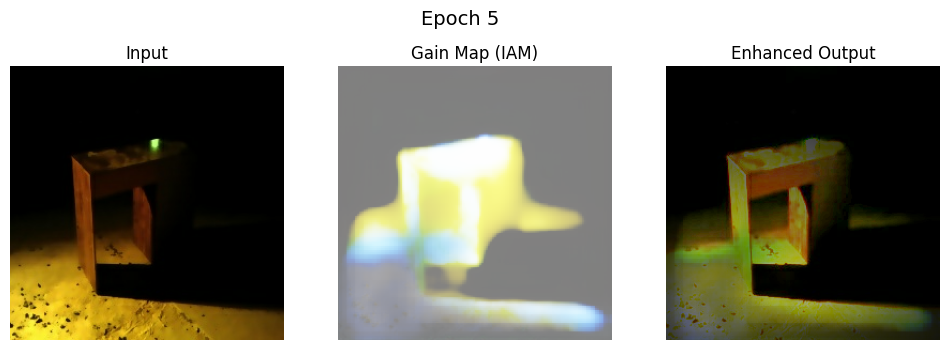

Saved checkpoint for epoch 5: ./training_checkpoints/ckpt-5

--- Starting Epoch 6 ---
Epoch 6 | Step 0: Loss = 0.3218
Epoch 6 | Step 100: Loss = 0.3066
Epoch 6 | Step 200: Loss = 0.2770
Epoch 6 | Step 300: Loss = 0.3587
Epoch 6 | Step 400: Loss = 0.3575
Epoch 6 completed in 26.48 seconds
Epoch 6 Average Loss: 0.3021

Visualizing results after Epoch 6


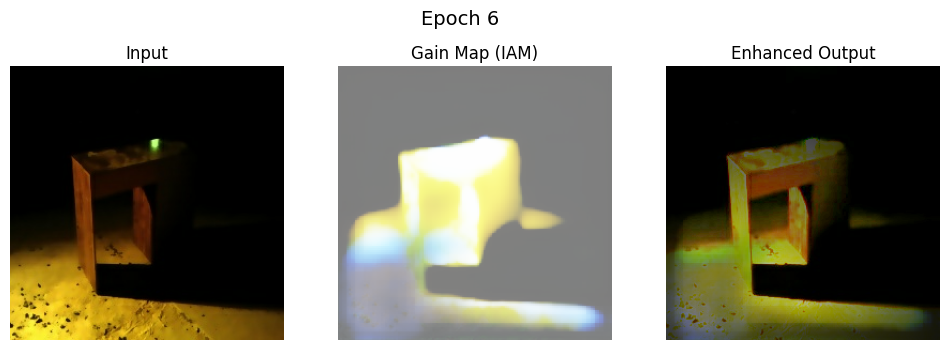

Saved checkpoint for epoch 6: ./training_checkpoints/ckpt-6

--- Starting Epoch 7 ---
Epoch 7 | Step 0: Loss = 0.3200
Epoch 7 | Step 100: Loss = 0.3073
Epoch 7 | Step 200: Loss = 0.2773
Epoch 7 | Step 300: Loss = 0.3564
Epoch 7 | Step 400: Loss = 0.3581
Epoch 7 completed in 26.35 seconds
Epoch 7 Average Loss: 0.3018

Visualizing results after Epoch 7


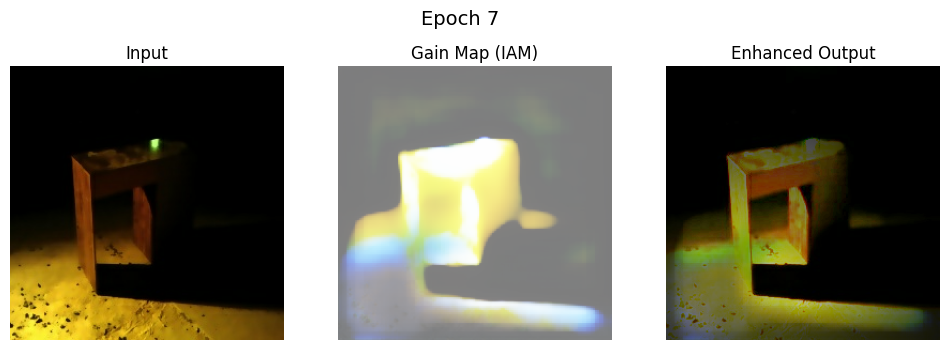

Saved checkpoint for epoch 7: ./training_checkpoints/ckpt-7

--- Starting Epoch 8 ---
Epoch 8 | Step 0: Loss = 0.3197
Epoch 8 | Step 100: Loss = 0.3060
Epoch 8 | Step 200: Loss = 0.2764
Epoch 8 | Step 300: Loss = 0.3560
Epoch 8 | Step 400: Loss = 0.3595
Epoch 8 completed in 26.36 seconds
Epoch 8 Average Loss: 0.3014

Visualizing results after Epoch 8


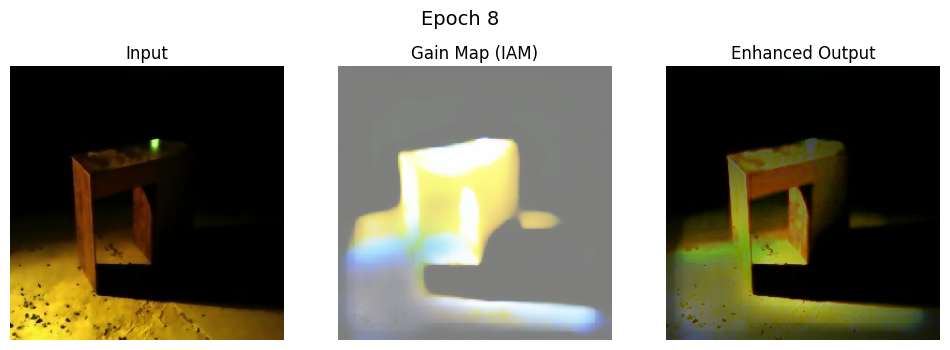

Saved checkpoint for epoch 8: ./training_checkpoints/ckpt-8

--- Starting Epoch 9 ---
Epoch 9 | Step 0: Loss = 0.3196
Epoch 9 | Step 100: Loss = 0.3068
Epoch 9 | Step 200: Loss = 0.2766
Epoch 9 | Step 300: Loss = 0.3553
Epoch 9 | Step 400: Loss = 0.3569
Epoch 9 completed in 26.47 seconds
Epoch 9 Average Loss: 0.3010

Visualizing results after Epoch 9


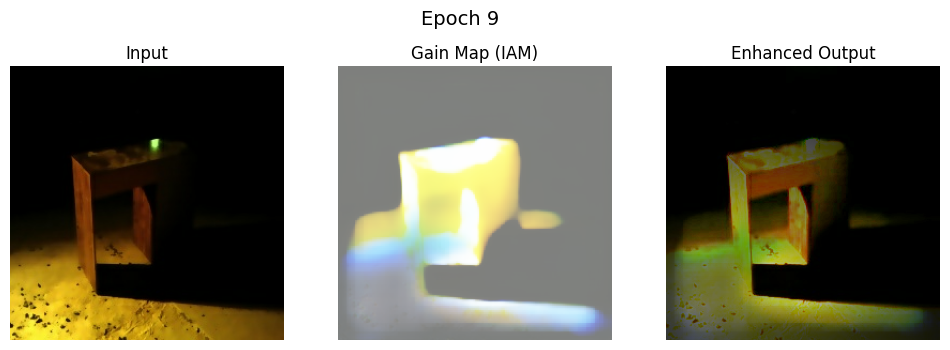

Saved checkpoint for epoch 9: ./training_checkpoints/ckpt-9

--- Starting Epoch 10 ---
Epoch 10 | Step 0: Loss = 0.3193
Epoch 10 | Step 100: Loss = 0.3058
Epoch 10 | Step 200: Loss = 0.2758
Epoch 10 | Step 300: Loss = 0.3543
Epoch 10 | Step 400: Loss = 0.3546
Epoch 10 completed in 26.39 seconds
Epoch 10 Average Loss: 0.3008

Visualizing results after Epoch 10


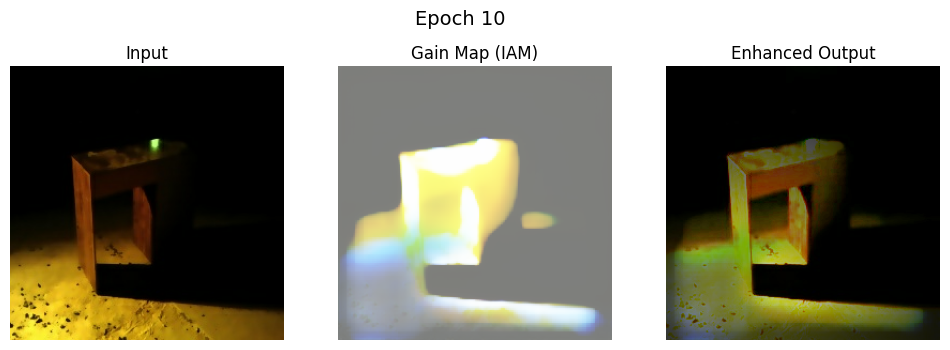

Saved checkpoint for epoch 10: ./training_checkpoints/ckpt-10

--- Starting Epoch 11 ---
Epoch 11 | Step 0: Loss = 0.3194
Epoch 11 | Step 100: Loss = 0.3056
Epoch 11 | Step 200: Loss = 0.2760
Epoch 11 | Step 300: Loss = 0.3548
Epoch 11 | Step 400: Loss = 0.3590
Epoch 11 completed in 26.43 seconds
Epoch 11 Average Loss: 0.3006

Visualizing results after Epoch 11


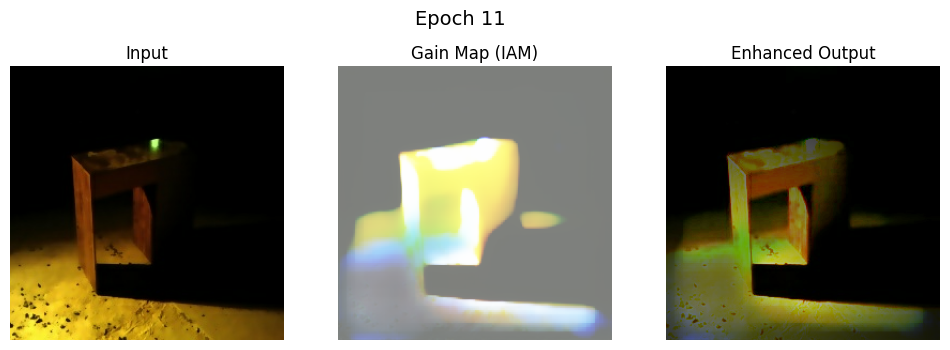

Saved checkpoint for epoch 11: ./training_checkpoints/ckpt-11

--- Starting Epoch 12 ---
Epoch 12 | Step 0: Loss = 0.3190
Epoch 12 | Step 100: Loss = 0.3053
Epoch 12 | Step 200: Loss = 0.2757
Epoch 12 | Step 300: Loss = 0.3530
Epoch 12 | Step 400: Loss = 0.3544
Epoch 12 completed in 26.45 seconds
Epoch 12 Average Loss: 0.3003

Visualizing results after Epoch 12


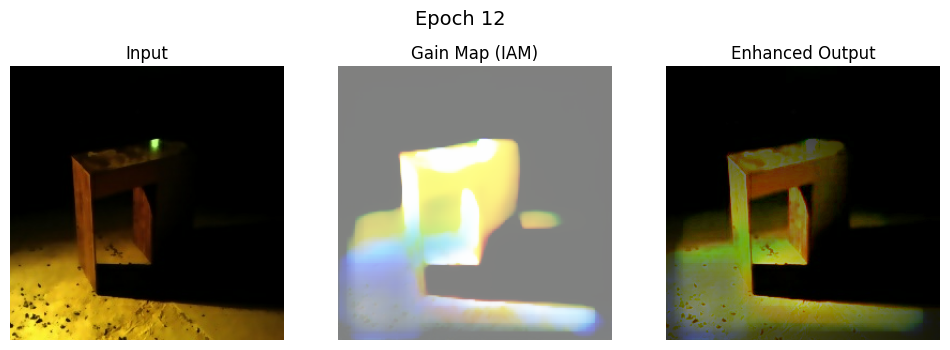

Saved checkpoint for epoch 12: ./training_checkpoints/ckpt-12

--- Starting Epoch 13 ---
Epoch 13 | Step 0: Loss = 0.3191
Epoch 13 | Step 100: Loss = 0.3051
Epoch 13 | Step 200: Loss = 0.2758
Epoch 13 | Step 300: Loss = 0.3537
Epoch 13 | Step 400: Loss = 0.3565
Epoch 13 completed in 26.45 seconds
Epoch 13 Average Loss: 0.3003

Visualizing results after Epoch 13


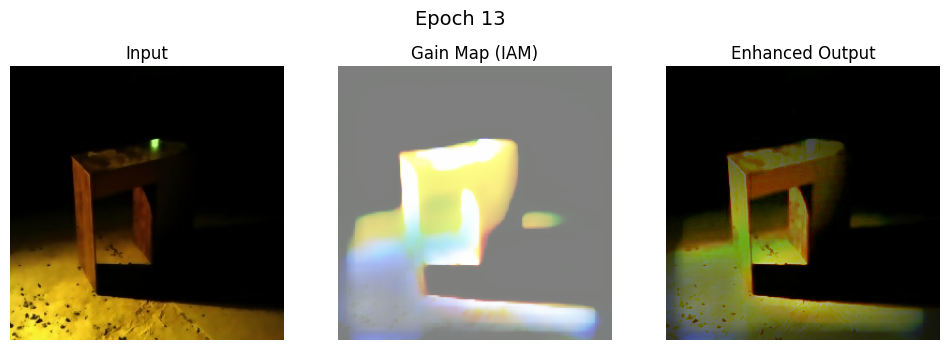

Saved checkpoint for epoch 13: ./training_checkpoints/ckpt-13

--- Starting Epoch 14 ---
Epoch 14 | Step 0: Loss = 0.3190
Epoch 14 | Step 100: Loss = 0.3052
Epoch 14 | Step 200: Loss = 0.2759
Epoch 14 | Step 300: Loss = 0.3538
Epoch 14 | Step 400: Loss = 0.3544
Epoch 14 completed in 26.49 seconds
Epoch 14 Average Loss: 0.3001

Visualizing results after Epoch 14


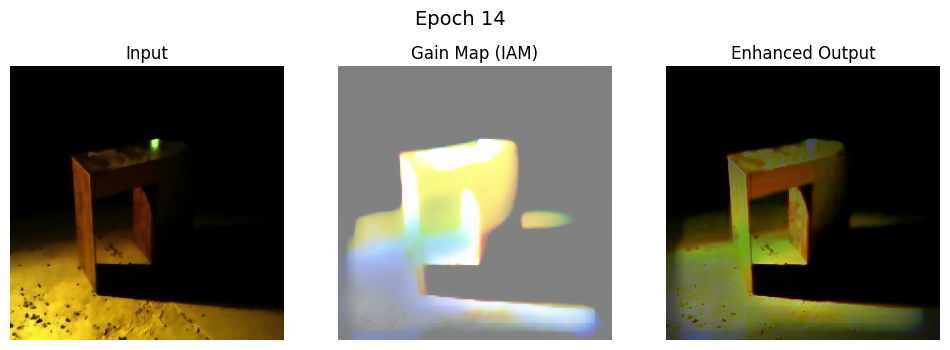

Saved checkpoint for epoch 14: ./training_checkpoints/ckpt-14

--- Starting Epoch 15 ---
Epoch 15 | Step 0: Loss = 0.3181
Epoch 15 | Step 100: Loss = 0.3052
Epoch 15 | Step 200: Loss = 0.2753
Epoch 15 | Step 300: Loss = 0.3531
Epoch 15 | Step 400: Loss = 0.3553
Epoch 15 completed in 26.41 seconds
Epoch 15 Average Loss: 0.2999

Visualizing results after Epoch 15


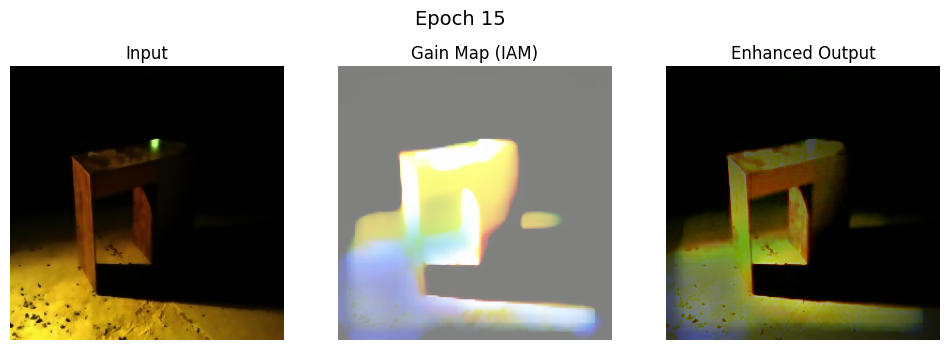

Saved checkpoint for epoch 15: ./training_checkpoints/ckpt-15

--- Starting Epoch 16 ---
Epoch 16 | Step 0: Loss = 0.3181
Epoch 16 | Step 100: Loss = 0.3054
Epoch 16 | Step 200: Loss = 0.2762
Epoch 16 | Step 300: Loss = 0.3533
Epoch 16 | Step 400: Loss = 0.3544
Epoch 16 completed in 26.45 seconds
Epoch 16 Average Loss: 0.2999

Visualizing results after Epoch 16


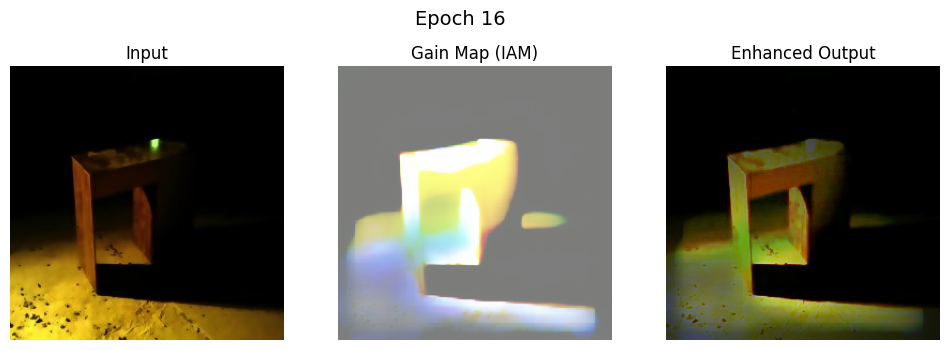

Saved checkpoint for epoch 16: ./training_checkpoints/ckpt-16

--- Starting Epoch 17 ---
Epoch 17 | Step 0: Loss = 0.3183
Epoch 17 | Step 100: Loss = 0.3050
Epoch 17 | Step 200: Loss = 0.2761
Epoch 17 | Step 300: Loss = 0.3527
Epoch 17 | Step 400: Loss = 0.3542
Epoch 17 completed in 26.43 seconds
Epoch 17 Average Loss: 0.2997

Visualizing results after Epoch 17


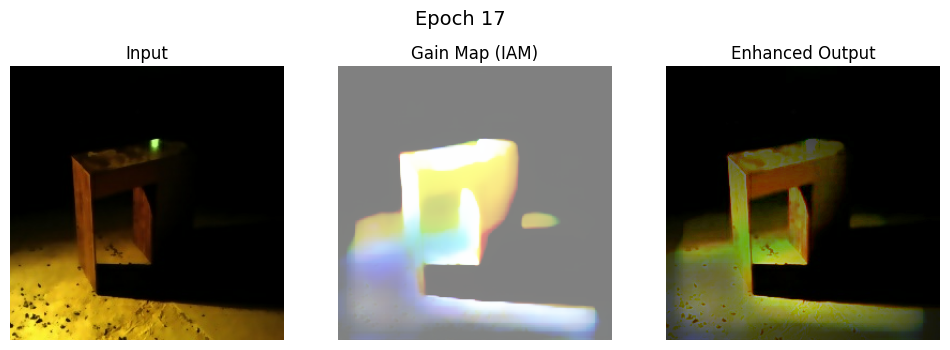

Saved checkpoint for epoch 17: ./training_checkpoints/ckpt-17

--- Starting Epoch 18 ---
Epoch 18 | Step 0: Loss = 0.3173
Epoch 18 | Step 100: Loss = 0.3048
Epoch 18 | Step 200: Loss = 0.2750
Epoch 18 | Step 300: Loss = 0.3551
Epoch 18 | Step 400: Loss = 0.3546
Epoch 18 completed in 26.44 seconds
Epoch 18 Average Loss: 0.2997

Visualizing results after Epoch 18


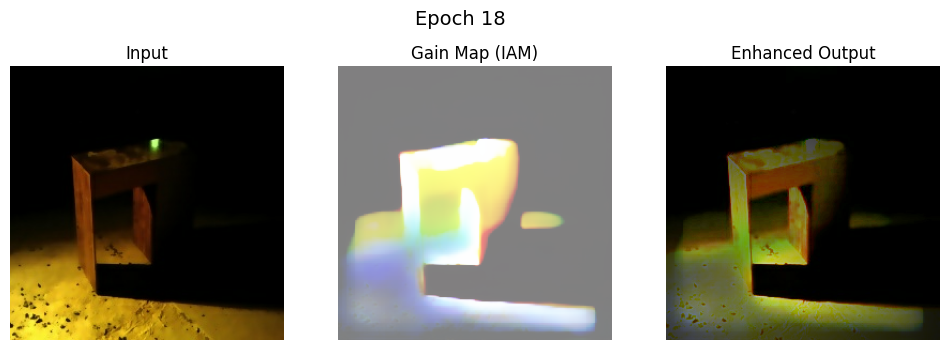

Saved checkpoint for epoch 18: ./training_checkpoints/ckpt-18

--- Starting Epoch 19 ---
Epoch 19 | Step 0: Loss = 0.3172
Epoch 19 | Step 100: Loss = 0.3065
Epoch 19 | Step 200: Loss = 0.2749
Epoch 19 | Step 300: Loss = 0.3524
Epoch 19 | Step 400: Loss = 0.3539
Epoch 19 completed in 26.48 seconds
Epoch 19 Average Loss: 0.2995

Visualizing results after Epoch 19


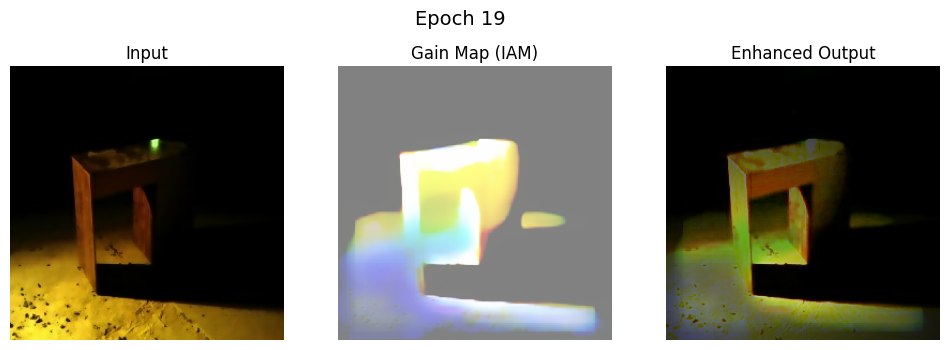

Saved checkpoint for epoch 19: ./training_checkpoints/ckpt-19

--- Starting Epoch 20 ---
Epoch 20 | Step 0: Loss = 0.3174
Epoch 20 | Step 100: Loss = 0.3054
Epoch 20 | Step 200: Loss = 0.2747
Epoch 20 | Step 300: Loss = 0.3523
Epoch 20 | Step 400: Loss = 0.3545
Epoch 20 completed in 26.47 seconds
Epoch 20 Average Loss: 0.2995

Visualizing results after Epoch 20


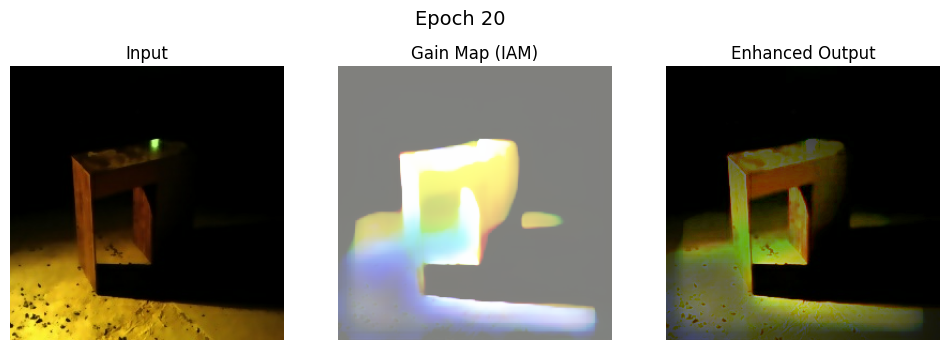

Saved checkpoint for epoch 20: ./training_checkpoints/ckpt-20

--- Starting Epoch 21 ---
Epoch 21 | Step 0: Loss = 0.3173
Epoch 21 | Step 100: Loss = 0.3051
Epoch 21 | Step 200: Loss = 0.2749
Epoch 21 | Step 300: Loss = 0.3521
Epoch 21 | Step 400: Loss = 0.3536
Epoch 21 completed in 26.46 seconds
Epoch 21 Average Loss: 0.2992

Visualizing results after Epoch 21


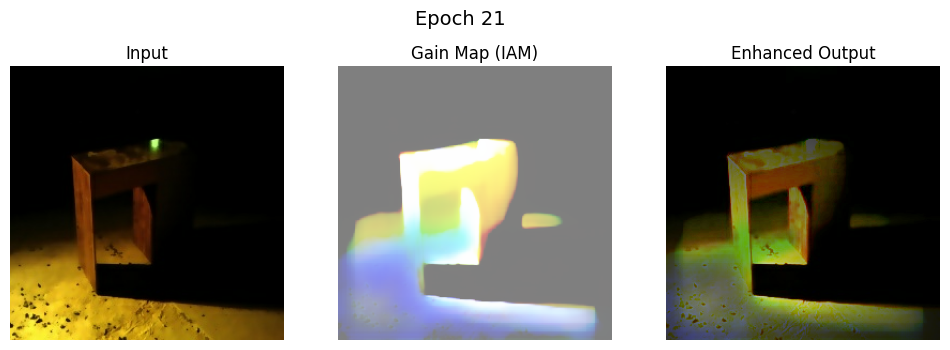

Saved checkpoint for epoch 21: ./training_checkpoints/ckpt-21

--- Starting Epoch 22 ---
Epoch 22 | Step 0: Loss = 0.3172
Epoch 22 | Step 100: Loss = 0.3049
Epoch 22 | Step 200: Loss = 0.2748
Epoch 22 | Step 300: Loss = 0.3524
Epoch 22 | Step 400: Loss = 0.3530
Epoch 22 completed in 26.44 seconds
Epoch 22 Average Loss: 0.2992

Visualizing results after Epoch 22


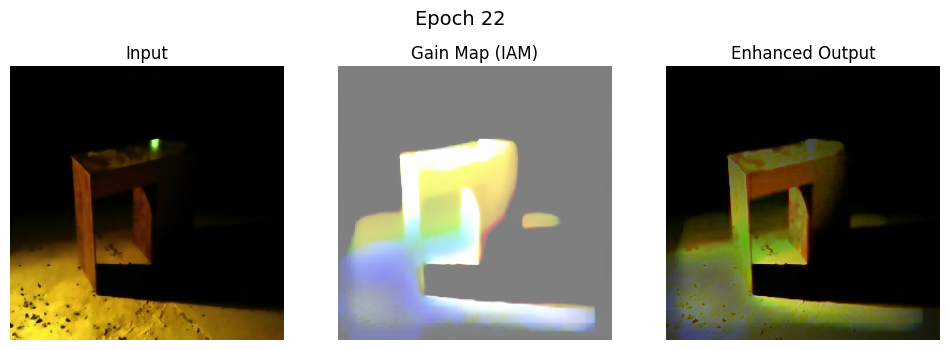

Saved checkpoint for epoch 22: ./training_checkpoints/ckpt-22

--- Starting Epoch 23 ---
Epoch 23 | Step 0: Loss = 0.3171
Epoch 23 | Step 100: Loss = 0.3042
Epoch 23 | Step 200: Loss = 0.2748
Epoch 23 | Step 300: Loss = 0.3533
Epoch 23 | Step 400: Loss = 0.3532
Epoch 23 completed in 26.48 seconds
Epoch 23 Average Loss: 0.2991

Visualizing results after Epoch 23


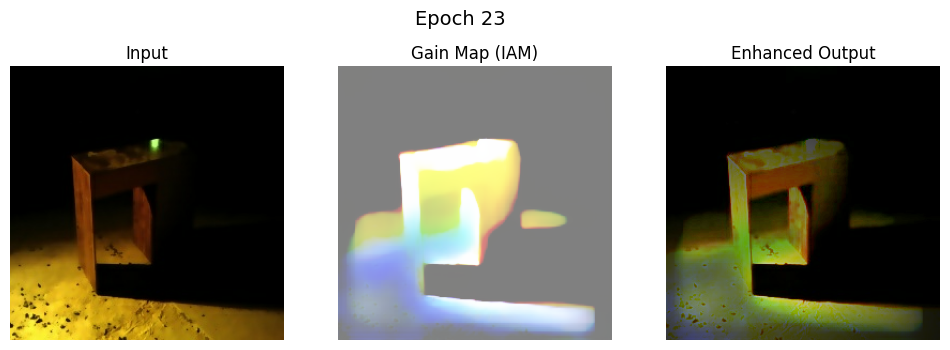

Saved checkpoint for epoch 23: ./training_checkpoints/ckpt-23

--- Starting Epoch 24 ---
Epoch 24 | Step 0: Loss = 0.3167
Epoch 24 | Step 100: Loss = 0.3046
Epoch 24 | Step 200: Loss = 0.2757
Epoch 24 | Step 300: Loss = 0.3535
Epoch 24 | Step 400: Loss = 0.3529
Epoch 24 completed in 26.45 seconds
Epoch 24 Average Loss: 0.2991

Visualizing results after Epoch 24


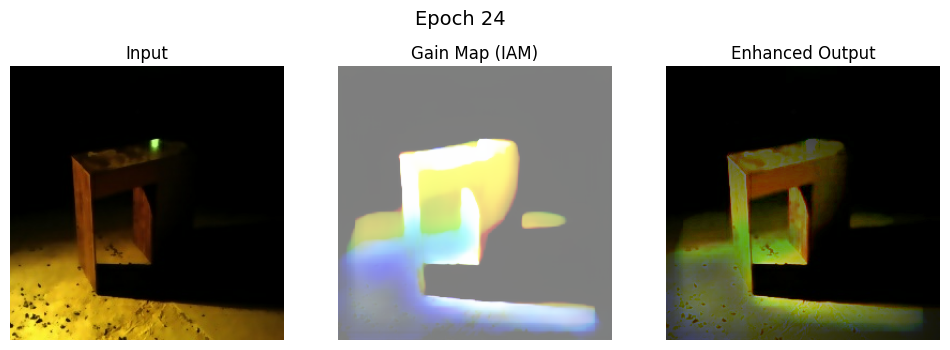

Saved checkpoint for epoch 24: ./training_checkpoints/ckpt-24

--- Starting Epoch 25 ---
Epoch 25 | Step 0: Loss = 0.3166
Epoch 25 | Step 100: Loss = 0.3043
Epoch 25 | Step 200: Loss = 0.2744
Epoch 25 | Step 300: Loss = 0.3524
Epoch 25 | Step 400: Loss = 0.3529
Epoch 25 completed in 26.49 seconds
Epoch 25 Average Loss: 0.2989

Visualizing results after Epoch 25


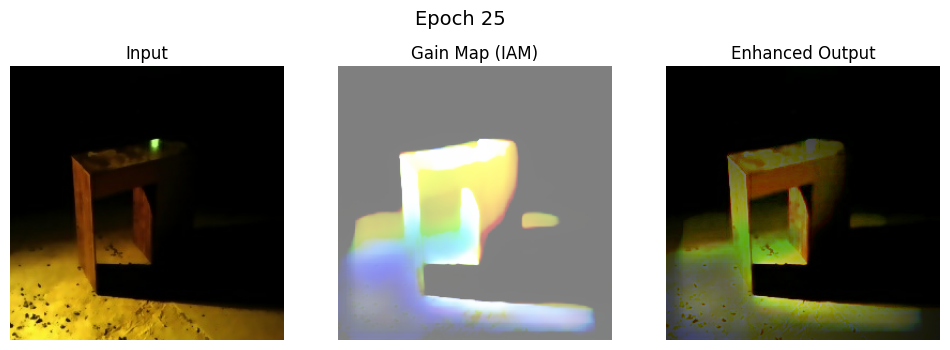

Saved checkpoint for epoch 25: ./training_checkpoints/ckpt-25

--- Starting Epoch 26 ---
Epoch 26 | Step 0: Loss = 0.3164
Epoch 26 | Step 100: Loss = 0.3041
Epoch 26 | Step 200: Loss = 0.2750
Epoch 26 | Step 300: Loss = 0.3526
Epoch 26 | Step 400: Loss = 0.3532
Epoch 26 completed in 26.42 seconds
Epoch 26 Average Loss: 0.2990

Visualizing results after Epoch 26


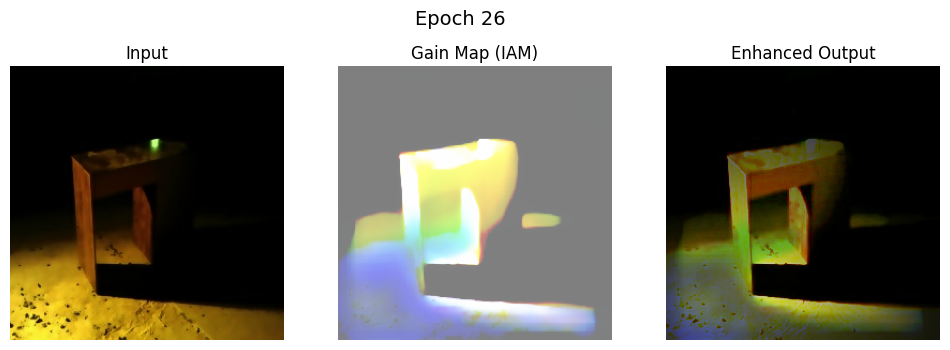

Saved checkpoint for epoch 26: ./training_checkpoints/ckpt-26

--- Starting Epoch 27 ---
Epoch 27 | Step 0: Loss = 0.3168
Epoch 27 | Step 100: Loss = 0.3041
Epoch 27 | Step 200: Loss = 0.2748
Epoch 27 | Step 300: Loss = 0.3524
Epoch 27 | Step 400: Loss = 0.3539
Epoch 27 completed in 26.36 seconds
Epoch 27 Average Loss: 0.2988

Visualizing results after Epoch 27


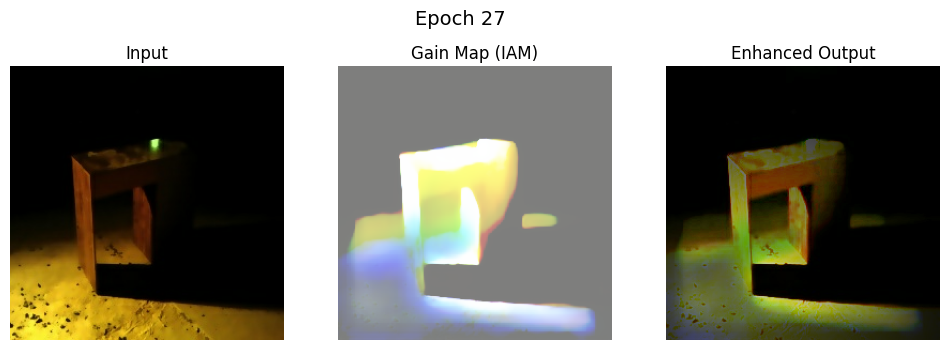

Saved checkpoint for epoch 27: ./training_checkpoints/ckpt-27

--- Starting Epoch 28 ---
Epoch 28 | Step 0: Loss = 0.3170
Epoch 28 | Step 100: Loss = 0.3041
Epoch 28 | Step 200: Loss = 0.2750
Epoch 28 | Step 300: Loss = 0.3524
Epoch 28 | Step 400: Loss = 0.3527
Epoch 28 completed in 26.48 seconds
Epoch 28 Average Loss: 0.2988

Visualizing results after Epoch 28


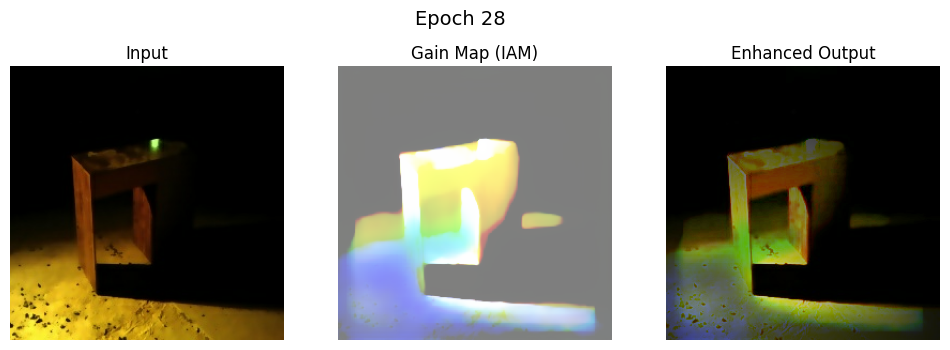

Saved checkpoint for epoch 28: ./training_checkpoints/ckpt-28

--- Starting Epoch 29 ---
Epoch 29 | Step 0: Loss = 0.3167
Epoch 29 | Step 100: Loss = 0.3041
Epoch 29 | Step 200: Loss = 0.2743
Epoch 29 | Step 300: Loss = 0.3524
Epoch 29 | Step 400: Loss = 0.3524
Epoch 29 completed in 26.58 seconds
Epoch 29 Average Loss: 0.2987

Visualizing results after Epoch 29


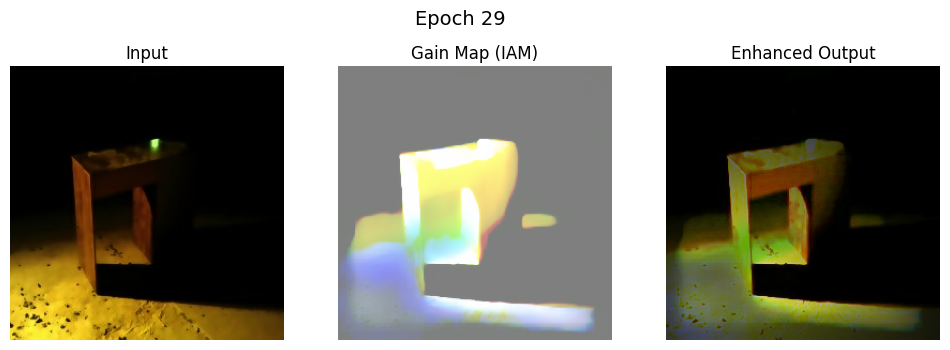

Saved checkpoint for epoch 29: ./training_checkpoints/ckpt-29

--- Starting Epoch 30 ---
Epoch 30 | Step 0: Loss = 0.3168
Epoch 30 | Step 100: Loss = 0.3053
Epoch 30 | Step 200: Loss = 0.2742
Epoch 30 | Step 300: Loss = 0.3524
Epoch 30 | Step 400: Loss = 0.3524
Epoch 30 completed in 26.54 seconds
Epoch 30 Average Loss: 0.2987

Visualizing results after Epoch 30


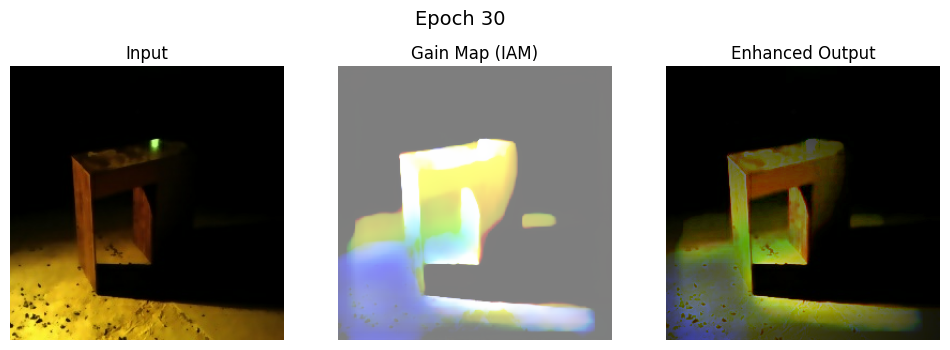

Saved checkpoint for epoch 30: ./training_checkpoints/ckpt-30

--- Starting Epoch 31 ---
Epoch 31 | Step 0: Loss = 0.3166
Epoch 31 | Step 100: Loss = 0.3039
Epoch 31 | Step 200: Loss = 0.2743
Epoch 31 | Step 300: Loss = 0.3521
Epoch 31 | Step 400: Loss = 0.3528
Epoch 31 completed in 26.55 seconds
Epoch 31 Average Loss: 0.2986

Visualizing results after Epoch 31


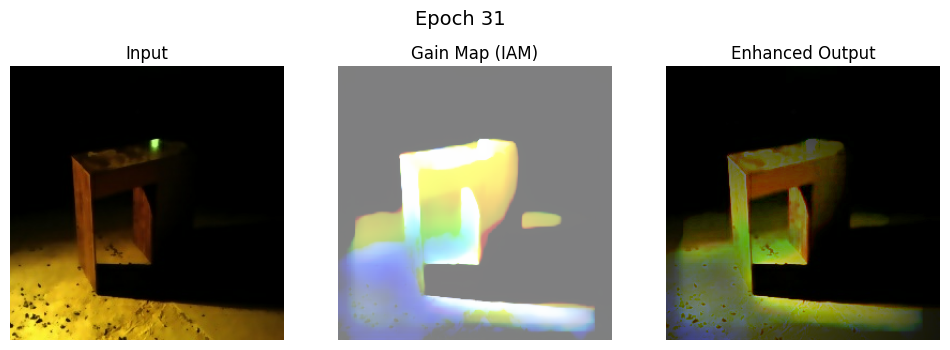

Saved checkpoint for epoch 31: ./training_checkpoints/ckpt-31

--- Starting Epoch 32 ---
Epoch 32 | Step 0: Loss = 0.3165
Epoch 32 | Step 100: Loss = 0.3040
Epoch 32 | Step 200: Loss = 0.2746
Epoch 32 | Step 300: Loss = 0.3521
Epoch 32 | Step 400: Loss = 0.3526
Epoch 32 completed in 26.57 seconds
Epoch 32 Average Loss: 0.2985

Visualizing results after Epoch 32


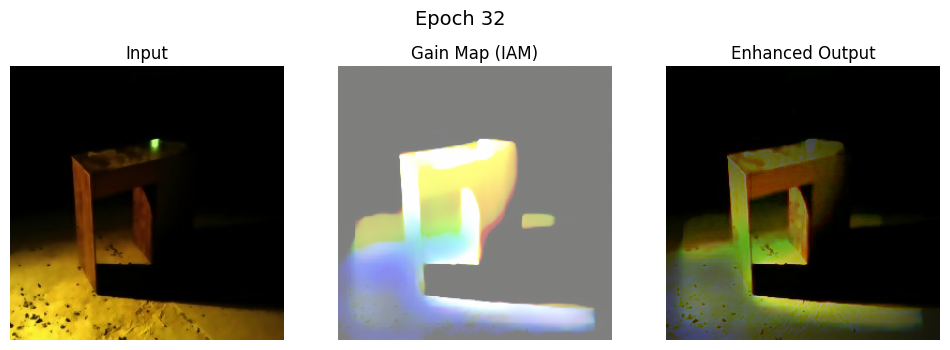

Saved checkpoint for epoch 32: ./training_checkpoints/ckpt-32

--- Starting Epoch 33 ---
Epoch 33 | Step 0: Loss = 0.3168
Epoch 33 | Step 100: Loss = 0.3043
Epoch 33 | Step 200: Loss = 0.2741
Epoch 33 | Step 300: Loss = 0.3536
Epoch 33 | Step 400: Loss = 0.3531
Epoch 33 completed in 26.45 seconds
Epoch 33 Average Loss: 0.2987

Visualizing results after Epoch 33


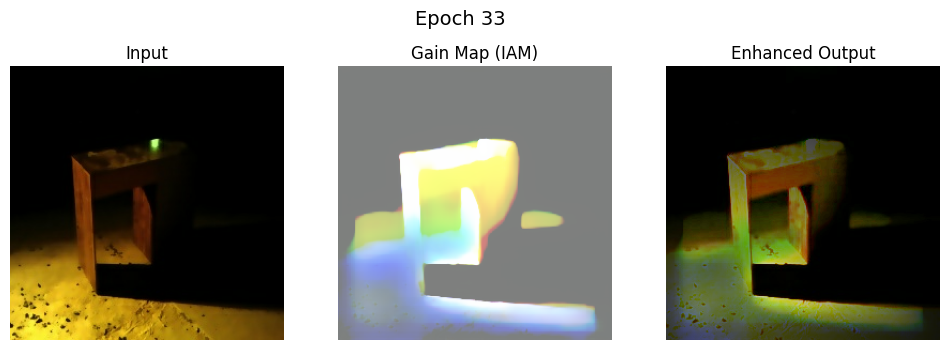

Saved checkpoint for epoch 33: ./training_checkpoints/ckpt-33

--- Starting Epoch 34 ---
Epoch 34 | Step 0: Loss = 0.3164
Epoch 34 | Step 100: Loss = 0.3040
Epoch 34 | Step 200: Loss = 0.2746
Epoch 34 | Step 300: Loss = 0.3518
Epoch 34 | Step 400: Loss = 0.3522
Epoch 34 completed in 26.41 seconds
Epoch 34 Average Loss: 0.2984

Visualizing results after Epoch 34


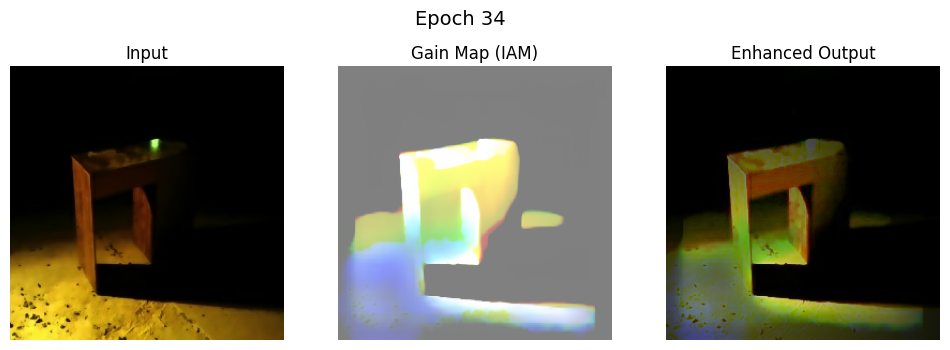

Saved checkpoint for epoch 34: ./training_checkpoints/ckpt-34

--- Starting Epoch 35 ---
Epoch 35 | Step 0: Loss = 0.3162
Epoch 35 | Step 100: Loss = 0.3043
Epoch 35 | Step 200: Loss = 0.2746
Epoch 35 | Step 300: Loss = 0.3528
Epoch 35 | Step 400: Loss = 0.3532
Epoch 35 completed in 26.55 seconds
Epoch 35 Average Loss: 0.2985

Visualizing results after Epoch 35


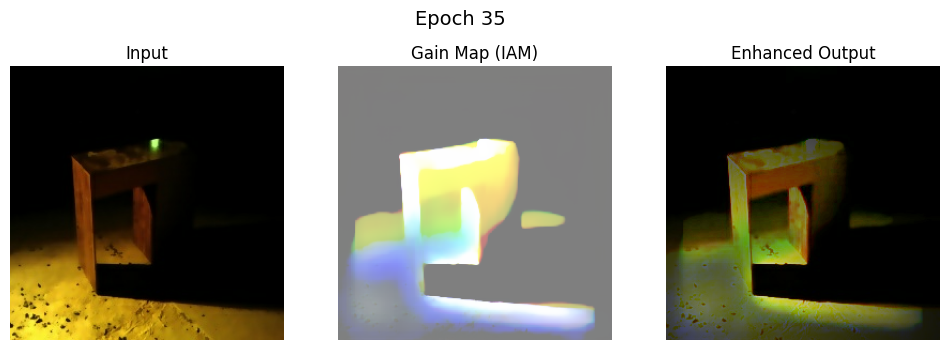

Saved checkpoint for epoch 35: ./training_checkpoints/ckpt-35

--- Starting Epoch 36 ---
Epoch 36 | Step 0: Loss = 0.3160
Epoch 36 | Step 100: Loss = 0.3037
Epoch 36 | Step 200: Loss = 0.2741
Epoch 36 | Step 300: Loss = 0.3522
Epoch 36 | Step 400: Loss = 0.3521
Epoch 36 completed in 26.56 seconds
Epoch 36 Average Loss: 0.2985

Visualizing results after Epoch 36


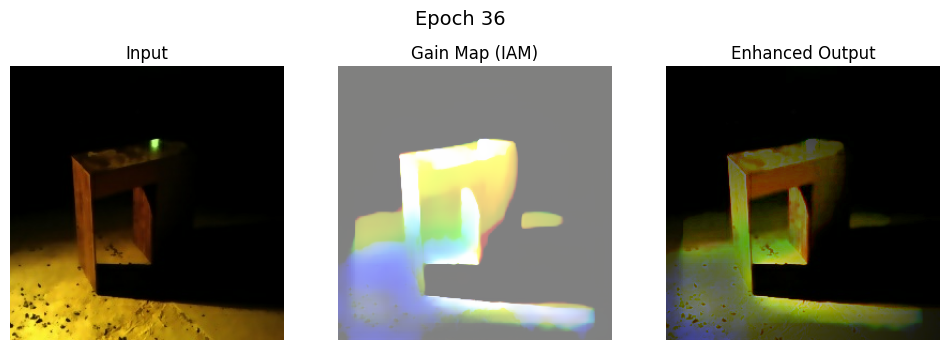

Saved checkpoint for epoch 36: ./training_checkpoints/ckpt-36

--- Starting Epoch 37 ---
Epoch 37 | Step 0: Loss = 0.3161
Epoch 37 | Step 100: Loss = 0.3043
Epoch 37 | Step 200: Loss = 0.2741
Epoch 37 | Step 300: Loss = 0.3516
Epoch 37 | Step 400: Loss = 0.3523
Epoch 37 completed in 26.54 seconds
Epoch 37 Average Loss: 0.2984

Visualizing results after Epoch 37


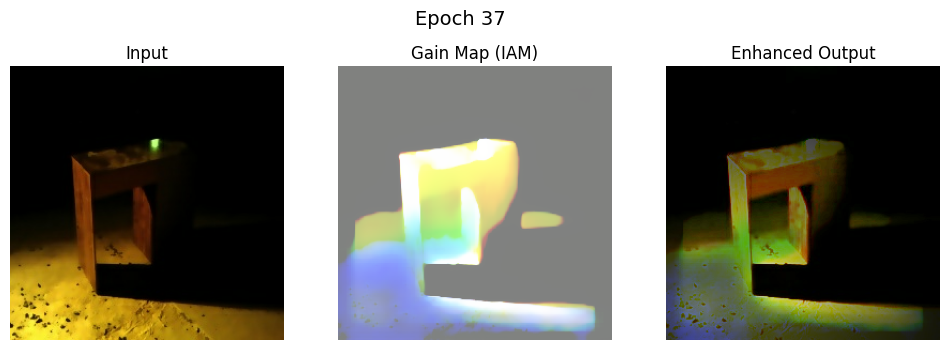

Saved checkpoint for epoch 37: ./training_checkpoints/ckpt-37

--- Starting Epoch 38 ---
Epoch 38 | Step 0: Loss = 0.3164
Epoch 38 | Step 100: Loss = 0.3041
Epoch 38 | Step 200: Loss = 0.2744
Epoch 38 | Step 300: Loss = 0.3520
Epoch 38 | Step 400: Loss = 0.3534
Epoch 38 completed in 26.58 seconds
Epoch 38 Average Loss: 0.2985

Visualizing results after Epoch 38


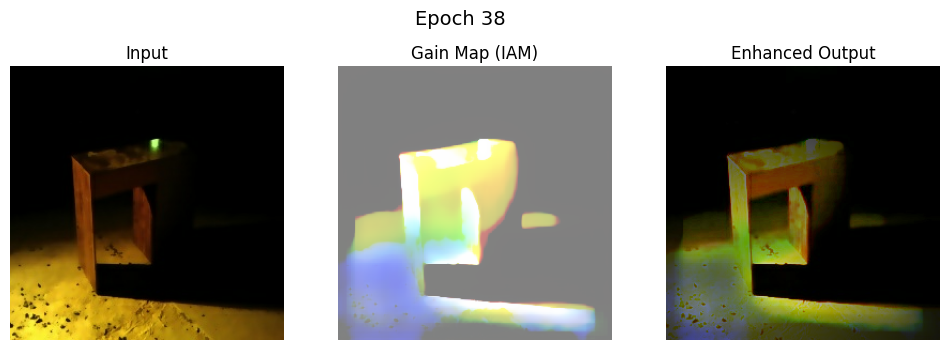

Saved checkpoint for epoch 38: ./training_checkpoints/ckpt-38

--- Starting Epoch 39 ---
Epoch 39 | Step 0: Loss = 0.3163
Epoch 39 | Step 100: Loss = 0.3037
Epoch 39 | Step 200: Loss = 0.2745
Epoch 39 | Step 300: Loss = 0.3517
Epoch 39 | Step 400: Loss = 0.3529
Epoch 39 completed in 26.67 seconds
Epoch 39 Average Loss: 0.2983

Visualizing results after Epoch 39


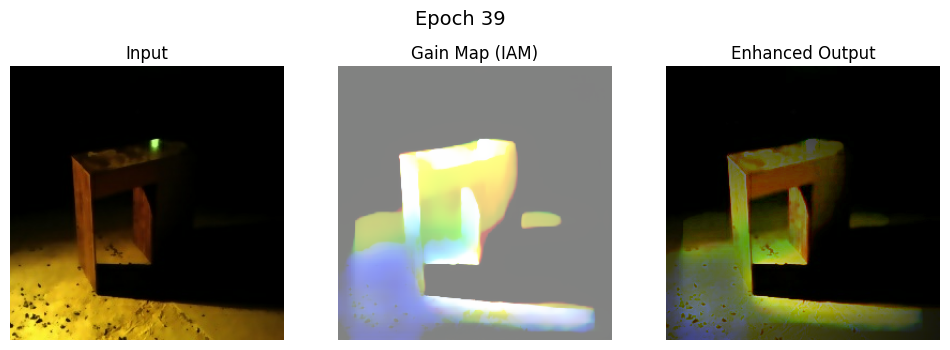

Saved checkpoint for epoch 39: ./training_checkpoints/ckpt-39

--- Starting Epoch 40 ---
Epoch 40 | Step 0: Loss = 0.3166
Epoch 40 | Step 100: Loss = 0.3041
Epoch 40 | Step 200: Loss = 0.2743
Epoch 40 | Step 300: Loss = 0.3522
Epoch 40 | Step 400: Loss = 0.3533
Epoch 40 completed in 26.71 seconds
Epoch 40 Average Loss: 0.2983

Visualizing results after Epoch 40


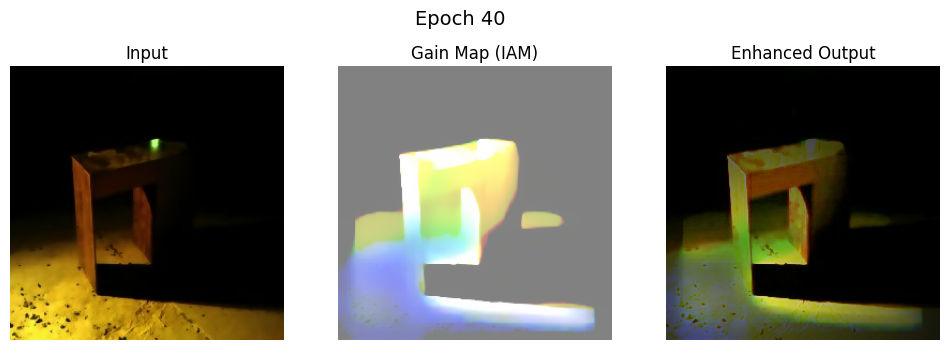

Saved checkpoint for epoch 40: ./training_checkpoints/ckpt-40

--- Starting Epoch 41 ---
Epoch 41 | Step 0: Loss = 0.3163
Epoch 41 | Step 100: Loss = 0.3035
Epoch 41 | Step 200: Loss = 0.2741
Epoch 41 | Step 300: Loss = 0.3520
Epoch 41 | Step 400: Loss = 0.3522
Epoch 41 completed in 26.63 seconds
Epoch 41 Average Loss: 0.2982

Visualizing results after Epoch 41


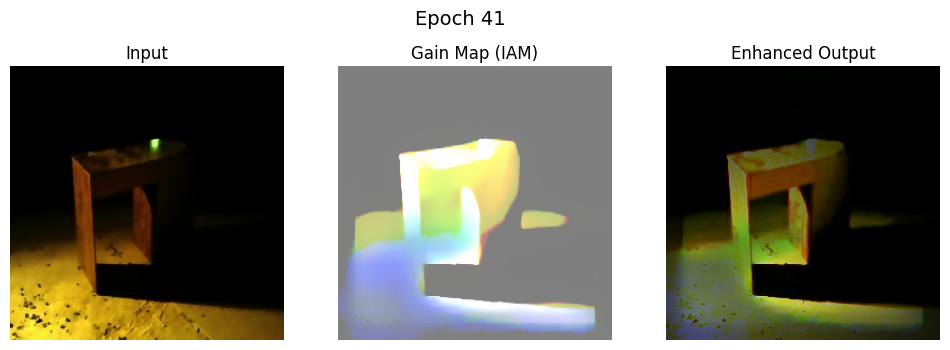

Saved checkpoint for epoch 41: ./training_checkpoints/ckpt-41

--- Starting Epoch 42 ---
Epoch 42 | Step 0: Loss = 0.3160
Epoch 42 | Step 100: Loss = 0.3037
Epoch 42 | Step 200: Loss = 0.2739
Epoch 42 | Step 300: Loss = 0.3520
Epoch 42 | Step 400: Loss = 0.3524
Epoch 42 completed in 26.67 seconds
Epoch 42 Average Loss: 0.2982

Visualizing results after Epoch 42


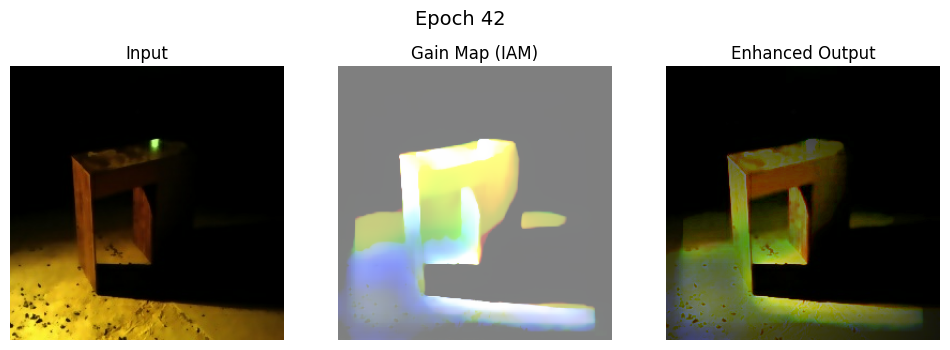

Saved checkpoint for epoch 42: ./training_checkpoints/ckpt-42

--- Starting Epoch 43 ---
Epoch 43 | Step 0: Loss = 0.3159
Epoch 43 | Step 100: Loss = 0.3038
Epoch 43 | Step 200: Loss = 0.2741
Epoch 43 | Step 300: Loss = 0.3519
Epoch 43 | Step 400: Loss = 0.3529
Epoch 43 completed in 26.72 seconds
Epoch 43 Average Loss: 0.2982

Visualizing results after Epoch 43


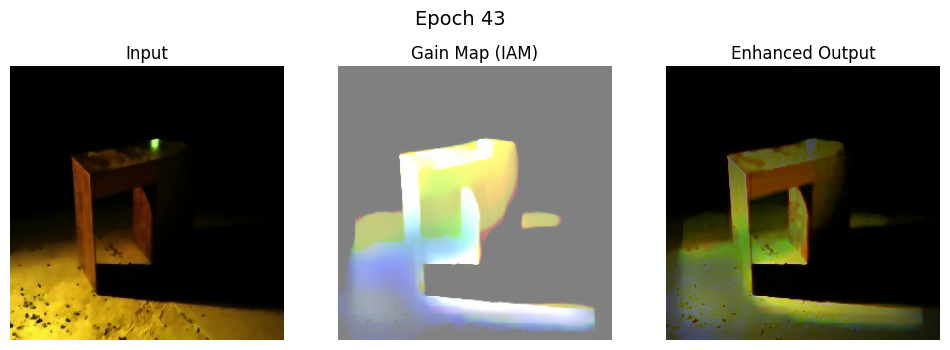

Saved checkpoint for epoch 43: ./training_checkpoints/ckpt-43

--- Starting Epoch 44 ---
Epoch 44 | Step 0: Loss = 0.3157
Epoch 44 | Step 100: Loss = 0.3039
Epoch 44 | Step 200: Loss = 0.2738
Epoch 44 | Step 300: Loss = 0.3519
Epoch 44 | Step 400: Loss = 0.3534
Epoch 44 completed in 26.77 seconds
Epoch 44 Average Loss: 0.2982

Visualizing results after Epoch 44


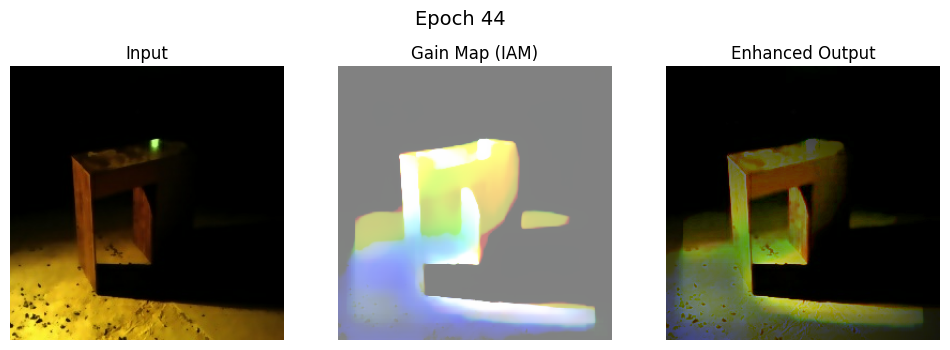

Saved checkpoint for epoch 44: ./training_checkpoints/ckpt-44

--- Starting Epoch 45 ---
Epoch 45 | Step 0: Loss = 0.3164
Epoch 45 | Step 100: Loss = 0.3034
Epoch 45 | Step 200: Loss = 0.2744
Epoch 45 | Step 300: Loss = 0.3519
Epoch 45 | Step 400: Loss = 0.3528
Epoch 45 completed in 26.71 seconds
Epoch 45 Average Loss: 0.2982

Visualizing results after Epoch 45


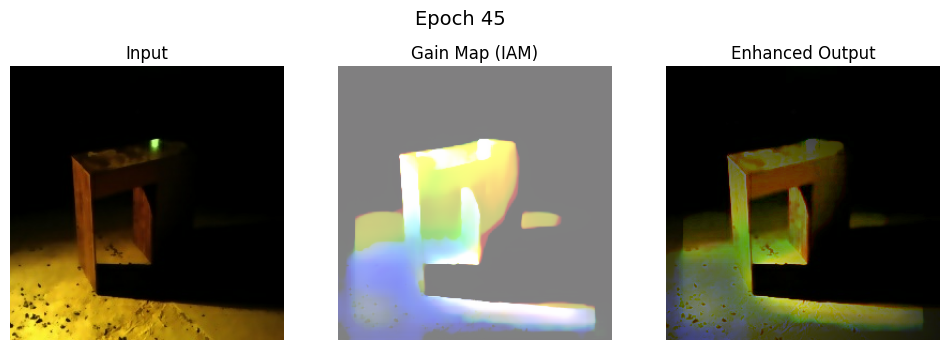

Saved checkpoint for epoch 45: ./training_checkpoints/ckpt-45

--- Starting Epoch 46 ---
Epoch 46 | Step 0: Loss = 0.3159
Epoch 46 | Step 100: Loss = 0.3039
Epoch 46 | Step 200: Loss = 0.2740
Epoch 46 | Step 300: Loss = 0.3516
Epoch 46 | Step 400: Loss = 0.3525
Epoch 46 completed in 26.50 seconds
Epoch 46 Average Loss: 0.2981

Visualizing results after Epoch 46


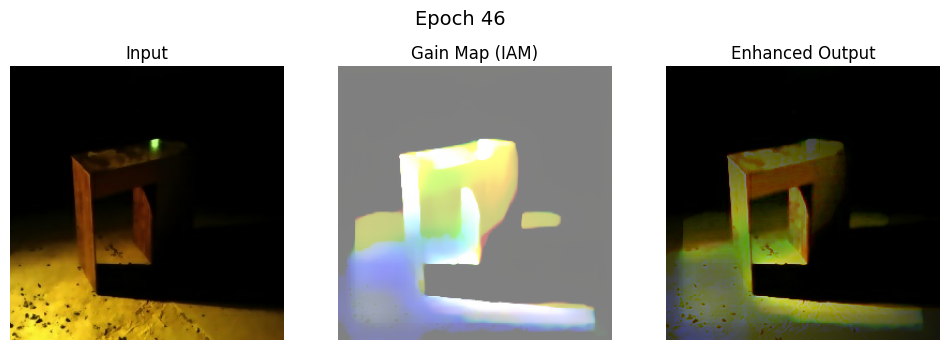

Saved checkpoint for epoch 46: ./training_checkpoints/ckpt-46

--- Starting Epoch 47 ---
Epoch 47 | Step 0: Loss = 0.3159
Epoch 47 | Step 100: Loss = 0.3036
Epoch 47 | Step 200: Loss = 0.2739
Epoch 47 | Step 300: Loss = 0.3516
Epoch 47 | Step 400: Loss = 0.3528
Epoch 47 completed in 26.45 seconds
Epoch 47 Average Loss: 0.2982

Visualizing results after Epoch 47


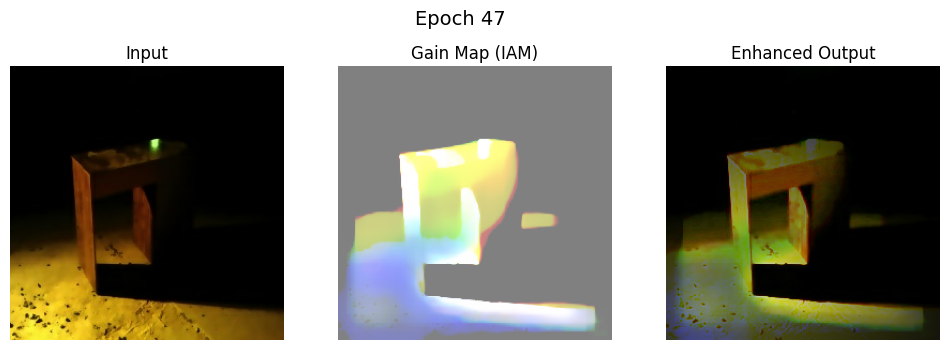

Saved checkpoint for epoch 47: ./training_checkpoints/ckpt-47

--- Starting Epoch 48 ---
Epoch 48 | Step 0: Loss = 0.3164
Epoch 48 | Step 100: Loss = 0.3037
Epoch 48 | Step 200: Loss = 0.2739
Epoch 48 | Step 300: Loss = 0.3514
Epoch 48 | Step 400: Loss = 0.3526
Epoch 48 completed in 26.55 seconds
Epoch 48 Average Loss: 0.2981

Visualizing results after Epoch 48


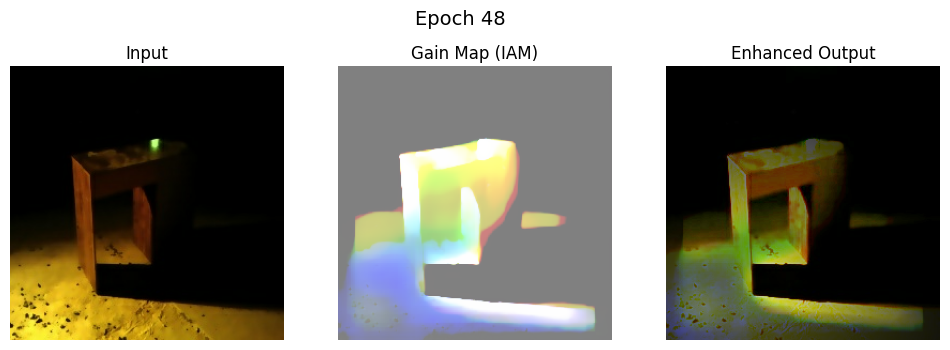

Saved checkpoint for epoch 48: ./training_checkpoints/ckpt-48

--- Starting Epoch 49 ---
Epoch 49 | Step 0: Loss = 0.3157
Epoch 49 | Step 100: Loss = 0.3032
Epoch 49 | Step 200: Loss = 0.2745
Epoch 49 | Step 300: Loss = 0.3514
Epoch 49 | Step 400: Loss = 0.3520
Epoch 49 completed in 26.49 seconds
Epoch 49 Average Loss: 0.2980

Visualizing results after Epoch 49


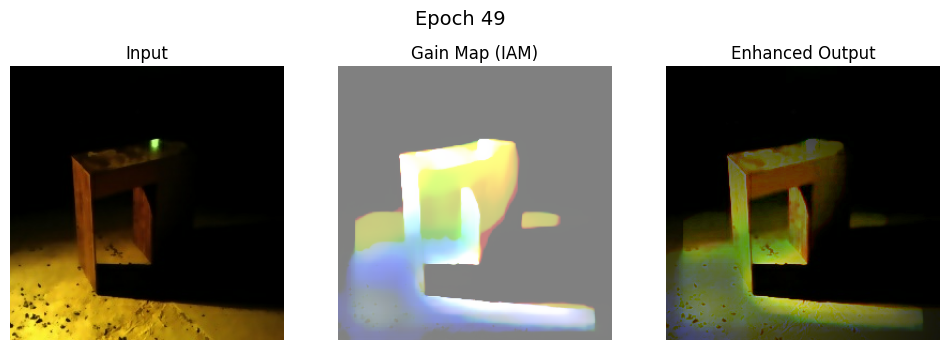

Saved checkpoint for epoch 49: ./training_checkpoints/ckpt-49

--- Starting Epoch 50 ---
Epoch 50 | Step 0: Loss = 0.3157
Epoch 50 | Step 100: Loss = 0.3042
Epoch 50 | Step 200: Loss = 0.2740
Epoch 50 | Step 300: Loss = 0.3525
Epoch 50 | Step 400: Loss = 0.3518
Epoch 50 completed in 26.48 seconds
Epoch 50 Average Loss: 0.2980

Visualizing results after Epoch 50


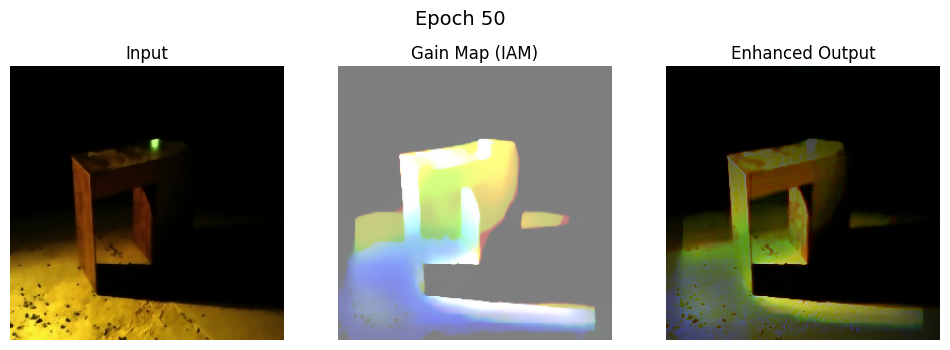

Saved checkpoint for epoch 50: ./training_checkpoints/ckpt-50

--- Starting Epoch 51 ---
Epoch 51 | Step 0: Loss = 0.3162
Epoch 51 | Step 100: Loss = 0.3045
Epoch 51 | Step 200: Loss = 0.2738
Epoch 51 | Step 300: Loss = 0.3515
Epoch 51 | Step 400: Loss = 0.3522
Epoch 51 completed in 26.45 seconds
Epoch 51 Average Loss: 0.2980

Visualizing results after Epoch 51


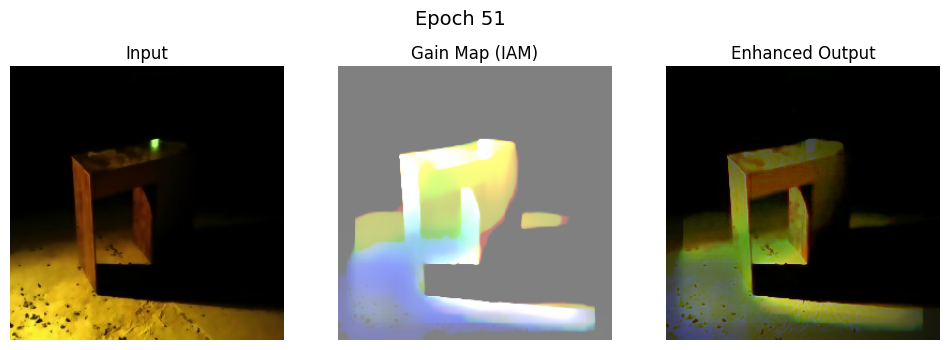

Saved checkpoint for epoch 51: ./training_checkpoints/ckpt-51

--- Starting Epoch 52 ---
Epoch 52 | Step 0: Loss = 0.3157
Epoch 52 | Step 100: Loss = 0.3037
Epoch 52 | Step 200: Loss = 0.2741
Epoch 52 | Step 300: Loss = 0.3522
Epoch 52 | Step 400: Loss = 0.3519
Epoch 52 completed in 26.44 seconds
Epoch 52 Average Loss: 0.2980

Visualizing results after Epoch 52


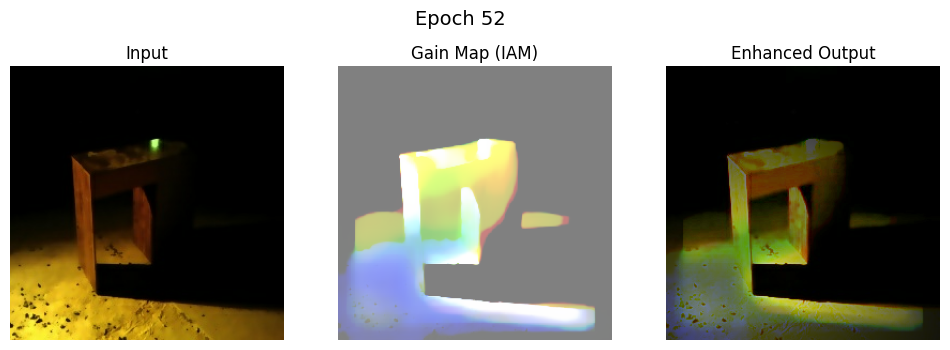

Saved checkpoint for epoch 52: ./training_checkpoints/ckpt-52

--- Starting Epoch 53 ---
Epoch 53 | Step 0: Loss = 0.3156
Epoch 53 | Step 100: Loss = 0.3039
Epoch 53 | Step 200: Loss = 0.2741
Epoch 53 | Step 300: Loss = 0.3514
Epoch 53 | Step 400: Loss = 0.3521
Epoch 53 completed in 26.47 seconds
Epoch 53 Average Loss: 0.2979

Visualizing results after Epoch 53


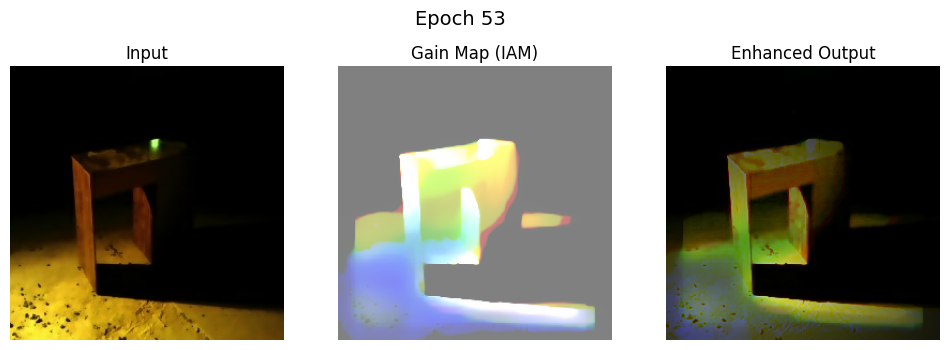

Saved checkpoint for epoch 53: ./training_checkpoints/ckpt-53

--- Starting Epoch 54 ---
Epoch 54 | Step 0: Loss = 0.3158
Epoch 54 | Step 100: Loss = 0.3032
Epoch 54 | Step 200: Loss = 0.2736
Epoch 54 | Step 300: Loss = 0.3515
Epoch 54 | Step 400: Loss = 0.3519
Epoch 54 completed in 26.43 seconds
Epoch 54 Average Loss: 0.2979

Visualizing results after Epoch 54


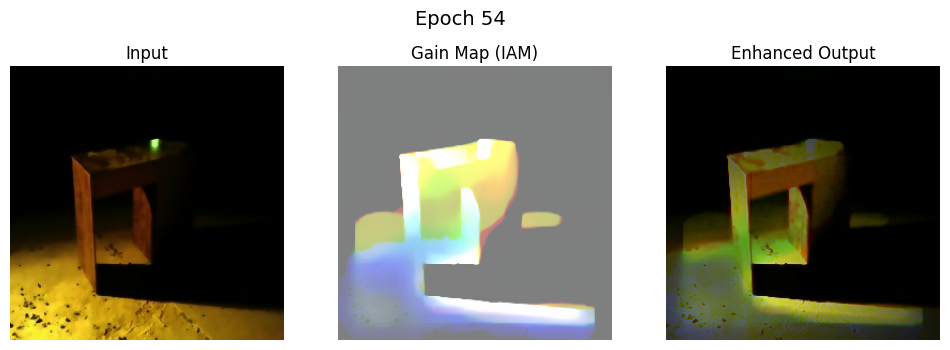

Saved checkpoint for epoch 54: ./training_checkpoints/ckpt-54

--- Starting Epoch 55 ---
Epoch 55 | Step 0: Loss = 0.3158
Epoch 55 | Step 100: Loss = 0.3036
Epoch 55 | Step 200: Loss = 0.2735
Epoch 55 | Step 300: Loss = 0.3518
Epoch 55 | Step 400: Loss = 0.3518
Epoch 55 completed in 26.50 seconds
Epoch 55 Average Loss: 0.2979

Visualizing results after Epoch 55


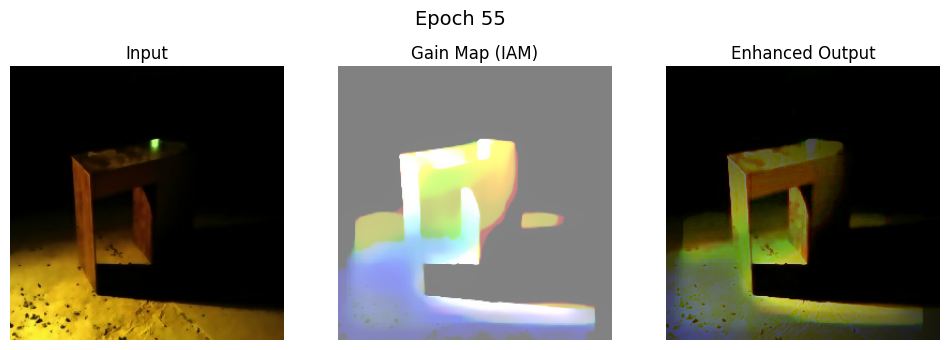

Saved checkpoint for epoch 55: ./training_checkpoints/ckpt-55

--- Starting Epoch 56 ---
Epoch 56 | Step 0: Loss = 0.3165
Epoch 56 | Step 100: Loss = 0.3033
Epoch 56 | Step 200: Loss = 0.2738
Epoch 56 | Step 300: Loss = 0.3512
Epoch 56 | Step 400: Loss = 0.3519
Epoch 56 completed in 26.47 seconds
Epoch 56 Average Loss: 0.2978

Visualizing results after Epoch 56


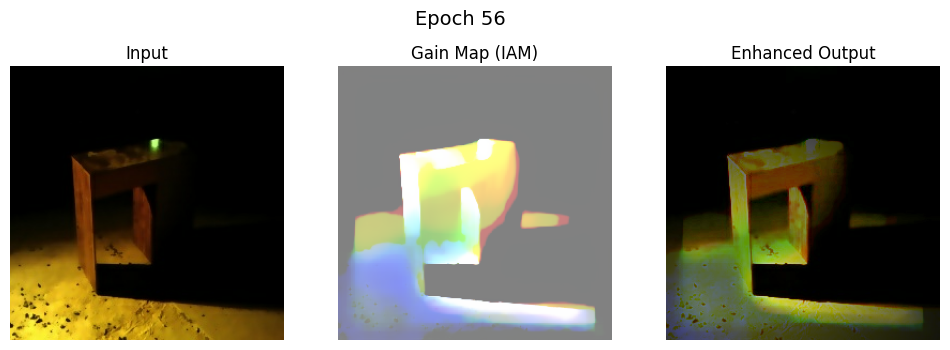

Saved checkpoint for epoch 56: ./training_checkpoints/ckpt-56

--- Starting Epoch 57 ---
Epoch 57 | Step 0: Loss = 0.3158
Epoch 57 | Step 100: Loss = 0.3037
Epoch 57 | Step 200: Loss = 0.2741
Epoch 57 | Step 300: Loss = 0.3516
Epoch 57 | Step 400: Loss = 0.3526
Epoch 57 completed in 26.55 seconds
Epoch 57 Average Loss: 0.2979

Visualizing results after Epoch 57


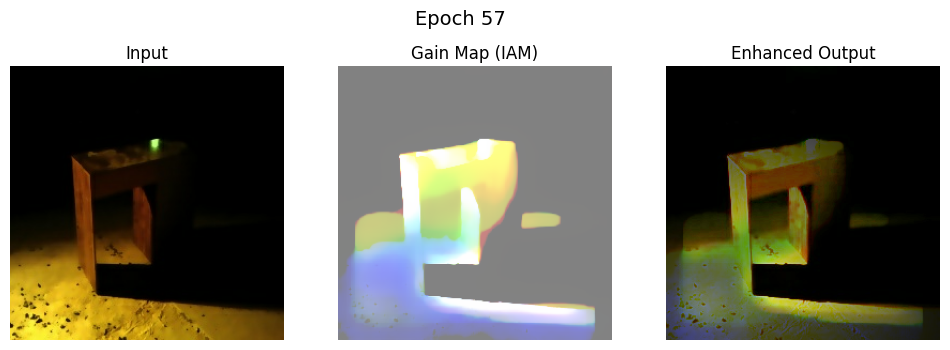

Saved checkpoint for epoch 57: ./training_checkpoints/ckpt-57

--- Starting Epoch 58 ---
Epoch 58 | Step 0: Loss = 0.3160
Epoch 58 | Step 100: Loss = 0.3034
Epoch 58 | Step 200: Loss = 0.2738
Epoch 58 | Step 300: Loss = 0.3514
Epoch 58 | Step 400: Loss = 0.3523
Epoch 58 completed in 26.46 seconds
Epoch 58 Average Loss: 0.2978

Visualizing results after Epoch 58


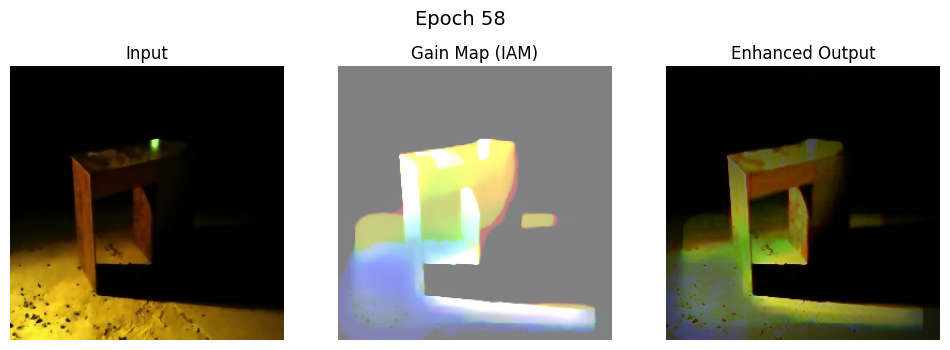

Saved checkpoint for epoch 58: ./training_checkpoints/ckpt-58

--- Starting Epoch 59 ---
Epoch 59 | Step 0: Loss = 0.3158
Epoch 59 | Step 100: Loss = 0.3032
Epoch 59 | Step 200: Loss = 0.2738
Epoch 59 | Step 300: Loss = 0.3517
Epoch 59 | Step 400: Loss = 0.3518
Epoch 59 completed in 26.56 seconds
Epoch 59 Average Loss: 0.2977

Visualizing results after Epoch 59


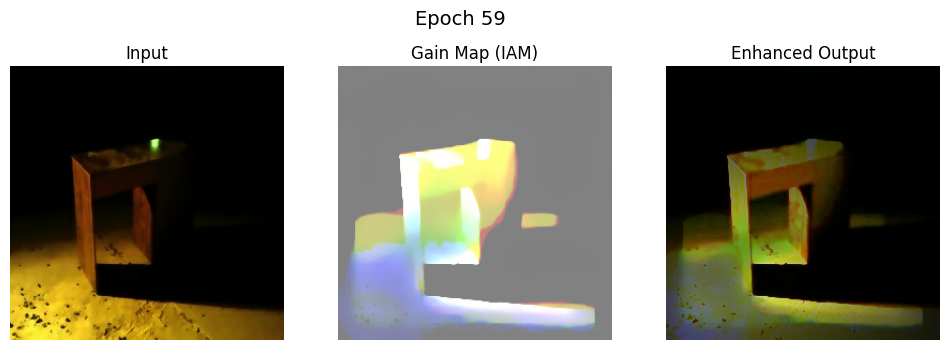

Saved checkpoint for epoch 59: ./training_checkpoints/ckpt-59

--- Starting Epoch 60 ---
Epoch 60 | Step 0: Loss = 0.3158
Epoch 60 | Step 100: Loss = 0.3030
Epoch 60 | Step 200: Loss = 0.2734
Epoch 60 | Step 300: Loss = 0.3521
Epoch 60 | Step 400: Loss = 0.3520
Epoch 60 completed in 26.63 seconds
Epoch 60 Average Loss: 0.2977

Visualizing results after Epoch 60


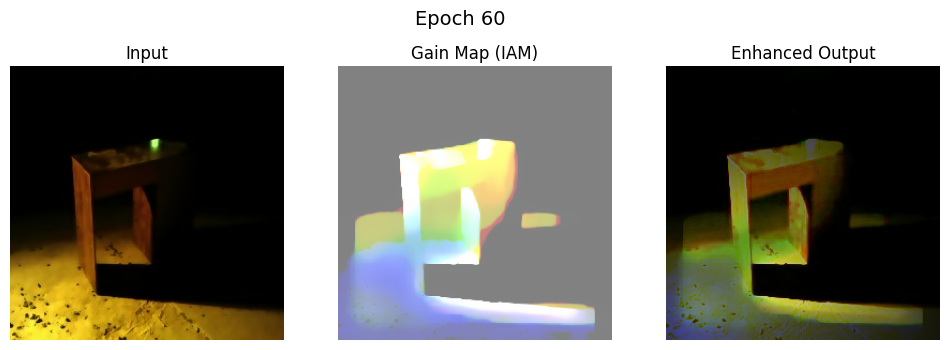

Saved checkpoint for epoch 60: ./training_checkpoints/ckpt-60

Total training time: 29.16 minutes


In [61]:
import os
import time
import numpy as np
import tensorflow as tf

# -------------------------------
# 1. Setup Checkpointing
# -------------------------------
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

checkpoint = tf.train.Checkpoint(optimizer=iam_opt, model=unet_iam)
manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=3)

# -------------------------------
# 2. Monitoring Sample
# -------------------------------
monitor_sample = next(iter(train_ds.take(1)))
monitor_sample = monitor_sample[:1]

# -------------------------------
# 3. Loss Logging
# -------------------------------
train_losses = []
all_epoch_losses = []

epochs = 60
training_start = time.time()

# -------------------------------
# 4. Training Loop
# -------------------------------
for epoch in range(epochs):

    print(f"\n--- Starting Epoch {epoch+1} ---")
    start_time = time.time()

    epoch_loss = []

    for step, low_light in enumerate(train_ds.take(500)):

        loss = train_step_illumination(low_light)

        epoch_loss.append(loss.numpy())

        if step % 100 == 0:
            print(f"Epoch {epoch+1} | Step {step}: Loss = {loss.numpy():.4f}")

    # -------------------------------
    # Epoch Statistics
    # -------------------------------
    avg_epoch_loss = np.mean(epoch_loss)

    train_losses.append(avg_epoch_loss)
    all_epoch_losses.append(epoch_loss)

    epoch_time = time.time() - start_time

    print(f"Epoch {epoch+1} completed in {epoch_time:.2f} seconds")
    print(f"Epoch {epoch+1} Average Loss: {avg_epoch_loss:.4f}")

    print(f"\nVisualizing results after Epoch {epoch+1}")
    plot_progress(monitor_sample, step=None, epoch=epoch)

    # -------------------------------
    # Save Progress Images
    # -------------------------------
    if (epoch + 1) % 10 == 0:
        save_progress_images(unet_iam, monitor_sample, epoch + 1)

    # -------------------------------
    # Save Checkpoint
    # -------------------------------
    save_path = manager.save()
    print(f"Saved checkpoint for epoch {epoch+1}: {save_path}")

# -------------------------------
# 5. Training Finished
# -------------------------------
total_time = (time.time() - training_start) / 60
print(f"\nTotal training time: {total_time:.2f} minutes")

# -------------------------------
# 6. Save Loss Logs for Charts
# -------------------------------
np.save("unet_train_losses.npy", train_losses)
np.save("unet_epoch_losses.npy", all_epoch_losses)

In [62]:
unet_iam.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ leaky_re_lu[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │        128 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 256, 256,  │          0 │ add[0][0]         │
│ (LeakyReLU)         │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     18,496 │ leaky_re_lu_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │     36,928 │ re_lu[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │     36,928 │ leaky_re_lu_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_5[0][0]  

 Total params: 4,898,184 (18.69 MB)

 Trainable params: 4,894,472 (18.67 MB)

 Non-trainable params: 3,712 (14.50 KB)

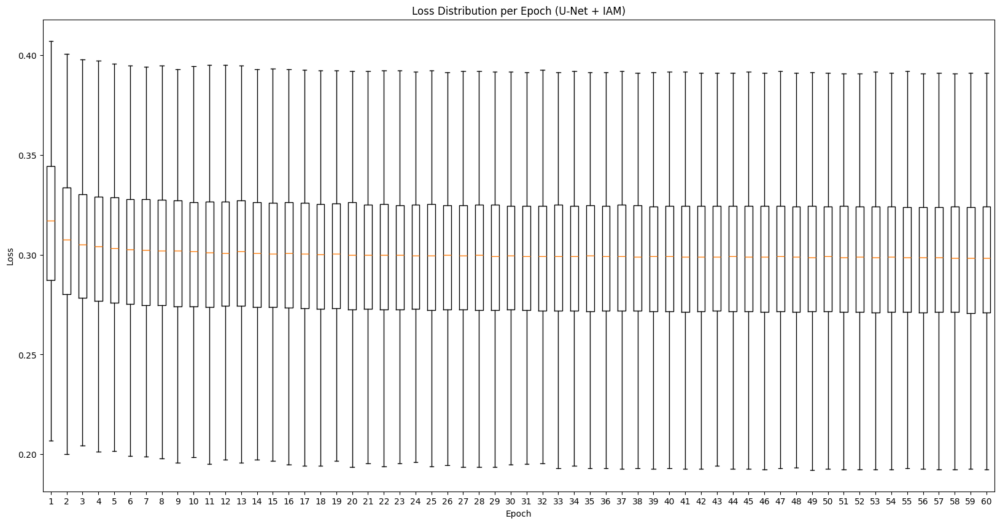

In [63]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))

plt.boxplot(all_epoch_losses, showfliers=False)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Distribution per Epoch (U-Net + IAM)")

plt.savefig("loss_distribution.png", dpi=300, bbox_inches="tight")
plt.show()

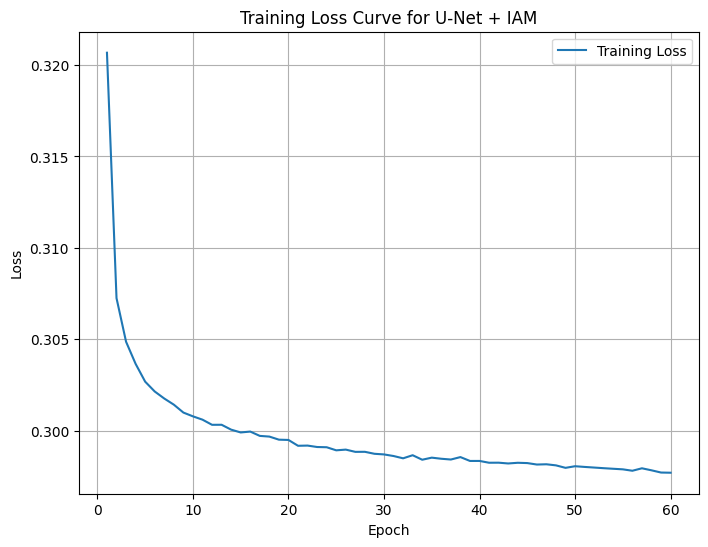

In [64]:
import matplotlib.pyplot as plt

epochs_range = range(1, len(train_losses) + 1)

plt.figure(figsize=(8,6))

plt.plot(epochs_range, train_losses, label="Training Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Curve for U-Net + IAM")
plt.legend()
plt.grid(True)

plt.show()

In [65]:
attn_layer_name = "concatenate_6"   # adjust if multiply_1, multiply_2 etc

iam_debug = tf.keras.Model(
    inputs=unet_iam.input,
    outputs=[
        unet_iam.output,                     # final illumination
        unet_iam.get_layer(attn_layer_name).output
    ]
)

In [66]:
def visualize_IAM(dataset, model):
    for batch in dataset.take(1):
        enhanced_init, reflectance, illum_init = retinex_enhancement(batch)
        preds, attn = model.predict(enhanced_init)

        plt.figure(figsize=(12, 6))

        for i in range(min(3, batch.shape[0])):
            # Input image
            plt.subplot(3, 3, i+1)
            plt.imshow(batch[i])
            plt.title("Input")
            plt.axis("off")

            # Illumination
            plt.subplot(3, 3, i+4)
            plt.imshow(preds[i, :, :, 0], cmap="gray")
            plt.title("Predicted Illum")
            plt.axis("off")

            # IAM attention
            attn_map = tf.reduce_mean(attn[i], axis=-1)
            plt.subplot(3, 3, i+7)
            plt.imshow(attn_map, cmap="inferno")
            plt.title("IAM Attention")
            plt.axis("off")

        plt.tight_layout()
        plt.show()
        break


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


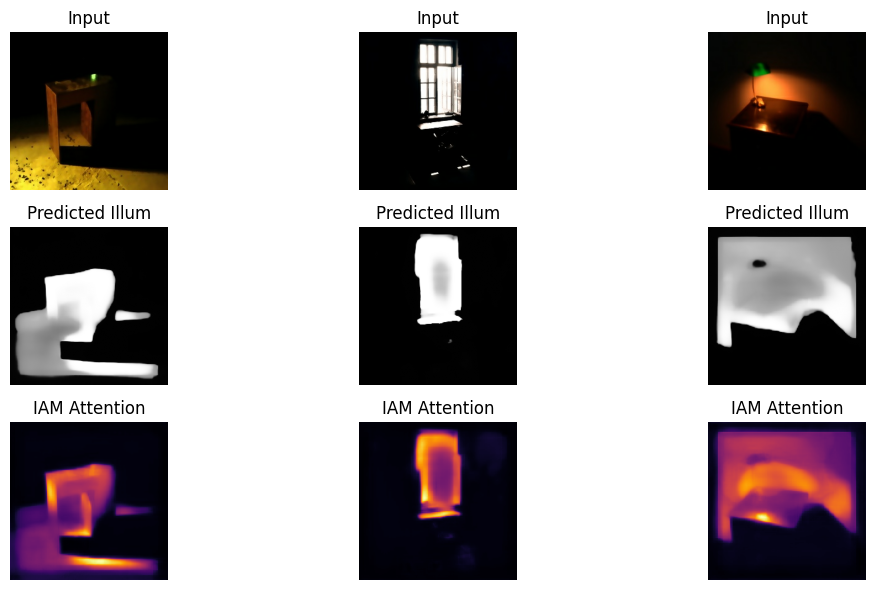

In [67]:
image_ds = train_ds.map(lambda img: img)
visualize_IAM(image_ds, iam_debug)

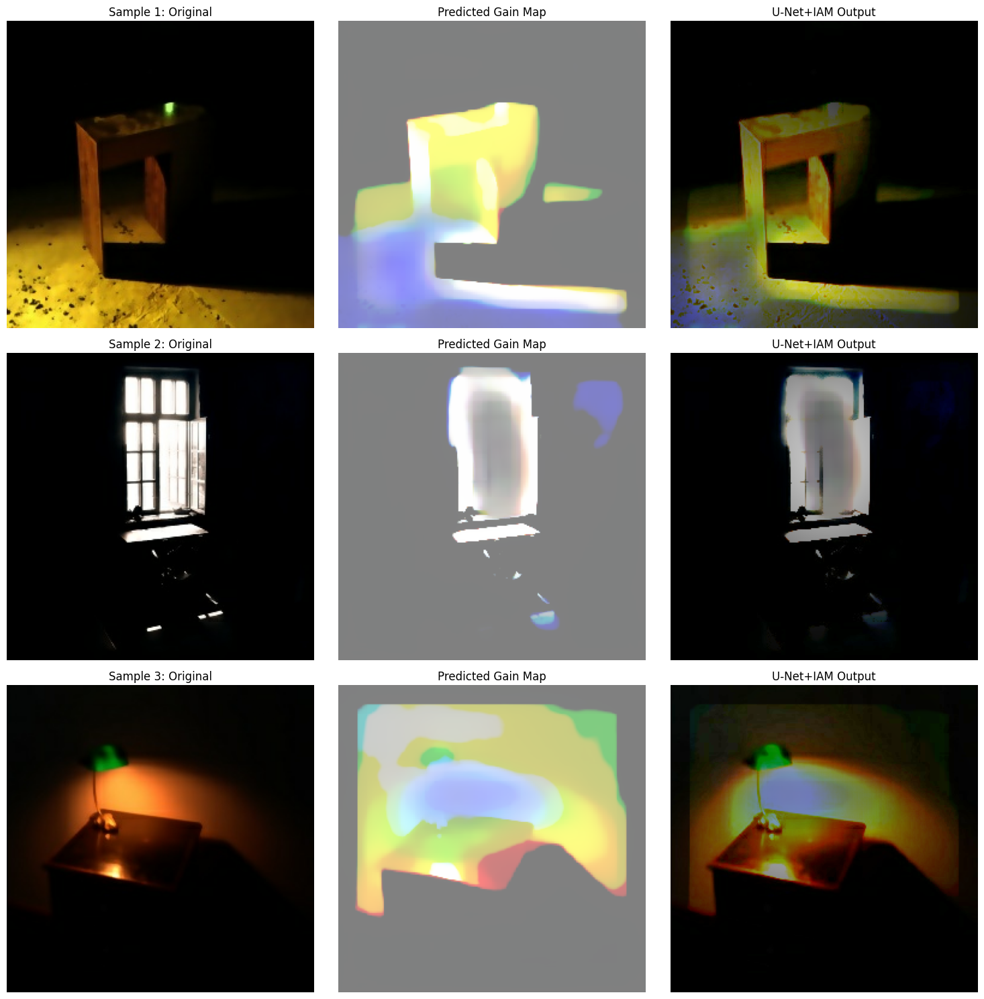

In [68]:
import matplotlib.pyplot as plt

def compare_results(model, test_dataset, num_samples=3):
    # Take one batch from the dataset
    for images in test_dataset.take(1):
        # Predict gain maps for the whole batch
        gain_maps = model(images, training=False)

        # Apply your logic to get the final enhanced image
        # Using the same formula from your train_step
        enhanced_init, _, _ = retinex_enhancement(images)
        correction = 0.8 + 3.0 * (gain_maps - 0.5)
        enhanced = enhanced_init * correction

        # Final Gamma adjustment as per your train_step
        gamma = tf.clip_by_value(1.2 - 0.5 * gain_maps, 0.8, 1.4)
        enhanced = tf.pow(enhanced + 1e-6, gamma)
        enhanced = tf.clip_by_value(enhanced, 0.0, 1.0)

        plt.figure(figsize=(15, 5 * num_samples))

        for i in range(num_samples):
            # 1. Original Dark Input
            plt.subplot(num_samples, 3, i*3 + 1)
            plt.imshow(images[i])
            plt.title(f"Sample {i+1}: Original")
            plt.axis('off')

            # 2. Gain Map (The Attention)
            plt.subplot(num_samples, 3, i*3 + 2)
            # Squeeze to 2D for heatmap visualization
            plt.imshow(tf.squeeze(gain_maps[i]), cmap='hot')
            plt.title("Predicted Gain Map")
            plt.axis('off')

            # 3. Model Output
            plt.subplot(num_samples, 3, i*3 + 3)
            plt.imshow(enhanced[i])
            plt.title("U-Net+IAM Output")
            plt.axis('off')

        plt.tight_layout()
        plt.show()

# Run the comparison
compare_results(unet_iam, ds, num_samples=3)

In [69]:
import tensorflow as tf
from tensorflow.keras import layers, Model

def build_discriminator(input_shape=(256, 256, 3)):
    """Standard patch-based discriminator (Global or Local)."""
    inputs = layers.Input(shape=input_shape)

    def d_block(x, filters, stride=2):
        x = layers.Conv2D(filters, 4, strides=stride, padding='same')(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.BatchNormalization()(x)
        return x

    x = d_block(inputs, 64)
    x = d_block(x, 128)
    x = d_block(x, 256)
    x = d_block(x, 512, stride=1)

    outputs = layers.Conv2D(1, 4, padding='same')(x)
    return Model(inputs, outputs)

# Initialize global and local discriminators
global_disc = build_discriminator()
local_disc = build_discriminator(input_shape=(None, None, 3)) # For random patches

/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [70]:
class EnlightenGAN(Model):
    def __init__(self, generator, global_disc, local_disc):
        super(EnlightenGAN, self).__init__()
        self.generator = generator
        self.global_disc = global_disc
        self.local_disc = local_disc
        self.vgg = self._build_vgg()
        self.mae = tf.keras.losses.MeanAbsoluteError()

    def _build_vgg(self):
        vgg = tf.keras.applications.VGG16(include_top=False, weights='imagenet')
        vgg.trainable = False
        return Model(vgg.input, vgg.get_layer('block3_conv3').output)

    def compile(self, g_opt, d_opt):
        super(EnlightenGAN, self).compile()
        self.g_opt = g_opt
        self.d_opt = d_opt

    def get_random_patch(self, img, patch_size=64):
        return tf.image.random_crop(img, size=[tf.shape(img)[0], patch_size, patch_size, 3])

    # Updated Frequency Loss to prevent gradient loss
    def frequency_loss(self, pred, target):
        pred_gray = tf.image.rgb_to_grayscale(pred)
        target_gray = tf.image.rgb_to_grayscale(target)

        # Cast to complex for FFT
        pred_fft = tf.signal.fft2d(tf.cast(pred_gray, tf.complex64))
        target_fft = tf.signal.fft2d(tf.cast(target_gray, tf.complex64))

        # Compare the MAGNITUDE (absolute value) of the frequencies
        # This avoids discarding the imaginary part incorrectly
        return tf.reduce_mean(tf.abs(tf.abs(pred_fft) - tf.abs(target_fft)))


    @tf.function
    def train_step(self, low_light):
        gamma = 0.4
        real_target = tf.pow(low_light, gamma)

        # --- 1. Train Discriminator (Once) ---
        with tf.GradientTape() as d_tape:
            res = self.generator(low_light, training=True)
            enhanced = tf.clip_by_value(low_light + res, 0.0, 1.0)

            # Instance noise helps prevent the Discriminator from becoming too perfect
            noise = tf.random.normal(tf.shape(enhanced), stddev=0.05)

            # Global Discriminator
            fake_g_logit = self.global_disc(enhanced + noise, training=True)
            real_g_logit = self.global_disc(real_target + noise, training=True)

            # Local Discriminator (Fixes the "Gradients do not exist" warning)
            # We take a random crop to train the local patches
            fake_patch = tf.image.random_crop(enhanced + noise, [tf.shape(enhanced)[0], 32, 32, 3])
            real_patch = tf.image.random_crop(real_target + noise, [tf.shape(real_target)[0], 32, 32, 3])
            fake_l_logit = self.local_disc(fake_patch, training=True)
            real_l_logit = self.local_disc(real_patch, training=True)

            # Combined LSGAN Loss
            d_loss_g = 0.5 * (tf.reduce_mean(tf.square(real_g_logit - 0.9)) + tf.reduce_mean(tf.square(fake_g_logit)))
            d_loss_l = 0.5 * (tf.reduce_mean(tf.square(real_l_logit - 0.9)) + tf.reduce_mean(tf.square(fake_l_logit)))
            d_loss = d_loss_g + d_loss_l

        d_grads = d_tape.gradient(d_loss, self.global_disc.trainable_variables + self.local_disc.trainable_variables)
        self.d_opt.apply_gradients(zip(d_grads, self.global_disc.trainable_variables + self.local_disc.trainable_variables))

        # --- 2. Train Generator (Twice to catch up) ---
        for _ in range(2):
            with tf.GradientTape() as g_tape:
                res = self.generator(low_light, training=True)
                enhanced = tf.clip_by_value(low_light + res, 0.0, 1.0)

                fake_g_logit = self.global_disc(enhanced, training=True)
                fake_l_logit = self.local_disc(tf.image.random_crop(enhanced, [tf.shape(enhanced)[0], 32, 32, 3]), training=True)

                # Adversarial Loss (Global + Local)
                g_adv = tf.reduce_mean(tf.square(fake_g_logit - 1.0)) + tf.reduce_mean(tf.square(fake_l_logit - 1.0))

                # Content and Exposure
                content_loss = self.mae(self.vgg(real_target), self.vgg(enhanced))
                over_exposure_penalty = tf.reduce_mean(tf.maximum(enhanced - 0.9, 0.0))

                # Boost adversarial weight if Generator is stagnant
                total_g_loss = (5.0 * g_adv) + (1.0 * content_loss) + (10.0 * over_exposure_penalty)

            g_grads = g_tape.gradient(total_g_loss, self.generator.trainable_variables)
            self.g_opt.apply_gradients(zip(g_grads, self.generator.trainable_variables))

        return {"g_loss": total_g_loss, "d_loss": d_loss}

In [71]:
import matplotlib.pyplot as plt

def save_progress_images(model, sample, epoch):

    pred = model(sample, training=False)

    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)
    plt.title("Input")
    plt.imshow(sample[0])
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title(f"Output Epoch {epoch}")
    plt.imshow(pred[0])
    plt.axis("off")

    plt.savefig(f"progress_epoch_{epoch}.png", dpi=300)
    plt.close()

In [72]:
enlighten_gan = EnlightenGAN(
    generator=unet_iam,
    global_disc=global_disc,
    local_disc=local_disc
)


enlighten_gan.compile(
    g_opt=tf.keras.optimizers.Adam(2e-4, beta_1=0.5),
    d_opt=tf.keras.optimizers.Adam(1e-5, beta_1=0.5)
)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [73]:
import time
import numpy as np

epochs = 30

monitor_sample = next(iter(train_ds.take(1)))
monitor_sample = monitor_sample[:1]

# Loss logging
g_losses = []
d_losses = []

all_g_losses = []
all_d_losses = []

training_start = time.time()

for epoch in range(epochs):

    print(f"\nEpoch {epoch+1}/{epochs}")
    start_time = time.time()

    epoch_g_loss = []
    epoch_d_loss = []

    for step, low_light in enumerate(train_ds.take(500)):

        losses = enlighten_gan.train_step(low_light)

        g_loss = losses['g_loss']
        d_loss = losses['d_loss']

        epoch_g_loss.append(g_loss)
        epoch_d_loss.append(d_loss)

        if step % 100 == 0:
            print(f"Step {step} -> G_Loss: {g_loss:.4f}, D_Loss: {d_loss:.4f}")

    # -------------------------------
    # Epoch Loss Statistics
    # -------------------------------
    avg_g = np.mean(epoch_g_loss)
    avg_d = np.mean(epoch_d_loss)

    g_losses.append(avg_g)
    d_losses.append(avg_d)

    all_g_losses.append(epoch_g_loss)
    all_d_losses.append(epoch_d_loss)

    epoch_time = time.time() - start_time

    print(f"Epoch {epoch+1} Avg Generator Loss: {avg_g:.4f}")
    print(f"Epoch {epoch+1} Avg Discriminator Loss: {avg_d:.4f}")
    print(f"Epoch {epoch+1} completed in {epoch_time:.2f} seconds")

    # -------------------------------
    # Save Progress Images
    # -------------------------------
    if (epoch + 1) % 10 == 0:
        save_progress_images(unet_iam, monitor_sample, epoch + 1)

# -------------------------------
# Training Finished
# -------------------------------
total_time = (time.time() - training_start) / 60
print(f"\nTotal training time: {total_time:.2f} minutes")

# -------------------------------
# Save Loss Logs
# -------------------------------
np.save("gan_g_losses.npy", g_losses)
np.save("gan_d_losses.npy", d_losses)

np.save("gan_all_g_losses.npy", all_g_losses)
np.save("gan_all_d_losses.npy", all_d_losses)


Epoch 1/30
Step 0 -> G_Loss: 23.4628, D_Loss: 4.0336
Step 100 -> G_Loss: 9.6966, D_Loss: 1.3880
Step 200 -> G_Loss: 8.7298, D_Loss: 0.9367
Step 300 -> G_Loss: 6.5595, D_Loss: 0.8808
Step 400 -> G_Loss: 5.8464, D_Loss: 1.0672
Epoch 1 Avg Generator Loss: 8.5564
Epoch 1 Avg Discriminator Loss: 1.1489
Epoch 1 completed in 107.41 seconds

Epoch 2/30
Step 0 -> G_Loss: 6.6942, D_Loss: 0.7416
Step 100 -> G_Loss: 5.6477, D_Loss: 0.6555
Step 200 -> G_Loss: 6.0236, D_Loss: 0.6321
Step 300 -> G_Loss: 4.8528, D_Loss: 0.5766
Step 400 -> G_Loss: 5.1155, D_Loss: 0.6415
Epoch 2 Avg Generator Loss: 5.4001
Epoch 2 Avg Discriminator Loss: 0.6012
Epoch 2 completed in 68.24 seconds

Epoch 3/30
Step 0 -> G_Loss: 4.8162, D_Loss: 0.5046
Step 100 -> G_Loss: 4.3285, D_Loss: 0.5569
Step 200 -> G_Loss: 4.6342, D_Loss: 0.5199
Step 300 -> G_Loss: 3.8917, D_Loss: 0.4459
Step 400 -> G_Loss: 4.5429, D_Loss: 0.5062
Epoch 3 Avg Generator Loss: 4.4453
Epoch 3 Avg Discriminator Loss: 0.5007
Epoch 3 completed in 68.14 seco

Epoch 10 Avg Generator Loss: 3.2911
Epoch 10 Avg Discriminator Loss: 0.4183
Epoch 10 completed in 68.34 seconds

Epoch 11/30
Step 0 -> G_Loss: 3.3488, D_Loss: 0.4008
Step 100 -> G_Loss: 3.2342, D_Loss: 0.4231
Step 200 -> G_Loss: 3.2374, D_Loss: 0.4095
Step 300 -> G_Loss: 3.3189, D_Loss: 0.3858
Step 400 -> G_Loss: 3.3358, D_Loss: 0.4067
Epoch 11 Avg Generator Loss: 3.2917
Epoch 11 Avg Discriminator Loss: 0.4166
Epoch 11 completed in 68.25 seconds

Epoch 12/30
Step 0 -> G_Loss: 3.2902, D_Loss: 0.4015
Step 100 -> G_Loss: 3.1821, D_Loss: 0.4274
Step 200 -> G_Loss: 3.5733, D_Loss: 0.4231
Step 300 -> G_Loss: 2.7516, D_Loss: 0.3778
Step 400 -> G_Loss: 2.9156, D_Loss: 0.4257
Epoch 12 Avg Generator Loss: 3.2726
Epoch 12 Avg Discriminator Loss: 0.4144
Epoch 12 completed in 68.19 seconds

Epoch 13/30
Step 0 -> G_Loss: 3.1380, D_Loss: 0.4108
Step 100 -> G_Loss: 3.2902, D_Loss: 0.4148
Step 200 -> G_Loss: 3.2504, D_Loss: 0.4055
Step 300 -> G_Loss: 3.0161, D_Loss: 0.4025
Step 400 -> G_Loss: 3.0129, D

Epoch 20 Avg Generator Loss: 3.1725
Epoch 20 Avg Discriminator Loss: 0.4114
Epoch 20 completed in 68.24 seconds

Epoch 21/30
Step 0 -> G_Loss: 2.9903, D_Loss: 0.3915
Step 100 -> G_Loss: 3.0844, D_Loss: 0.3974
Step 200 -> G_Loss: 3.4001, D_Loss: 0.3937
Step 300 -> G_Loss: 3.0058, D_Loss: 0.3719
Step 400 -> G_Loss: 3.0601, D_Loss: 0.4149
Epoch 21 Avg Generator Loss: 3.1542
Epoch 21 Avg Discriminator Loss: 0.4108
Epoch 21 completed in 68.27 seconds

Epoch 22/30
Step 0 -> G_Loss: 3.0682, D_Loss: 0.3781
Step 100 -> G_Loss: 3.1093, D_Loss: 0.4017
Step 200 -> G_Loss: 3.0224, D_Loss: 0.4060
Step 300 -> G_Loss: 2.9806, D_Loss: 0.4045
Step 400 -> G_Loss: 3.2153, D_Loss: 0.4094
Epoch 22 Avg Generator Loss: 3.1434
Epoch 22 Avg Discriminator Loss: 0.4101
Epoch 22 completed in 68.21 seconds

Epoch 23/30
Step 0 -> G_Loss: 3.0974, D_Loss: 0.4212
Step 100 -> G_Loss: 3.5894, D_Loss: 0.3924
Step 200 -> G_Loss: 3.0678, D_Loss: 0.4093
Step 300 -> G_Loss: 3.2038, D_Loss: 0.4003
Step 400 -> G_Loss: 2.8747, D

Epoch 30 Avg Generator Loss: 3.1285
Epoch 30 Avg Discriminator Loss: 0.4097
Epoch 30 completed in 68.14 seconds

Total training time: 34.79 minutes


In [74]:
def visualize_gan_results(model, low_light_sample):
    # 1. Get the residual from the generator
    # Ensure training=False to use Batchnorm in inference mode
    res = model.generator(low_light_sample, training=True)
    # enhanced = tf.clip_by_value(low_light_sample + res, 0.0, 1.0)
    # enhanced = tf.clip_by_value(low_light_sample + (res * 1.5), 0.0, 1.0)
    enhanced = tf.clip_by_value(low_light_sample + (res * 0.5 + 0.5), 0.0, 1.0)

    # 3. Plotting
    plt.figure(figsize=(15, 5))
    plt.suptitle(f'Result', fontsize=16)

    # Convert to numpy for plotting
    in_img = low_light_sample[0].numpy()
    res_img = res[0].numpy()
    out_img = enhanced[0].numpy()

    # Residuals can be 3-channel (RGB) or 1-channel.
    # Let's show the mean intensity of the residual for the map.
    res_map = np.mean(res_img, axis=-1)

    display_list = [in_img, res_map, out_img]
    titles = ['Input Low Light', 'Residual Map (Learned Light)', 'EnlightenGAN Output']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(titles[i])
        if i == 1:
            # Use 'viridis' or 'coolwarm' to see where light is being added
            plt.imshow(display_list[i], cmap='viridis')
            plt.colorbar(fraction=0.046, pad=0.04)
        else:
            plt.imshow(display_list[i])
        plt.axis('off')

    plt.show()

# Update your loop to use this fixed function:
# plot_progress(monitor_sample, step=None, epoch=epoch) -> visualize_gan_results(enlighten_gan, monitor_sample, epoch+1)

--- Training Complete. Visualizing Final Results ---


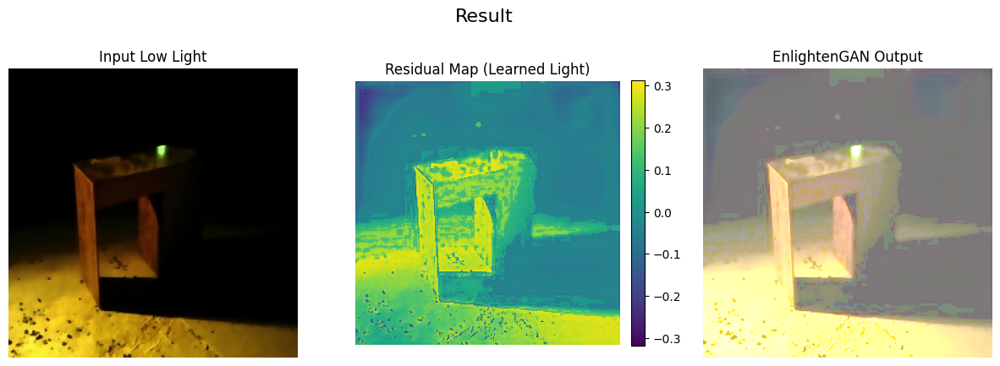

In [75]:

print("--- Training Complete. Visualizing Final Results ---")
visualize_gan_results(enlighten_gan, monitor_sample)

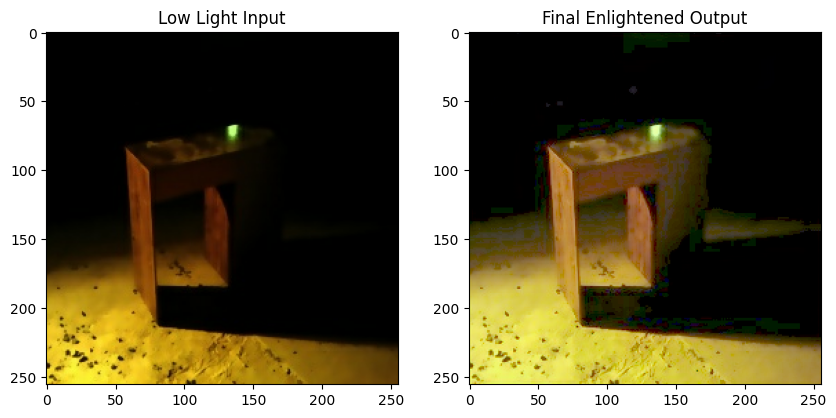

In [76]:
def compare_stages(low_light_sample):


    # enhanced, _, _ = retinex_enhancement(low_light_sample)
    residual = enlighten_gan.generator(low_light_sample, training=True)
    gamma = tf.clip_by_value(1.2 - 0.5 * residual, 0.8, 1.4)



    # enhanced = tf.clip_by_value(low_light_sample + residual, 0.0, 1.0)
    # enhanced = tf.clip_by_value(low_light_sample + (residual * 0.5 + 0.5), 0.0, 1.0)
    enhanced = tf.clip_by_value(low_light_sample + residual, 0.0, 1.0)
    # enhanced = tf.pow(enhanced + 1e-6, gamma)


    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.title("Low Light Input")
    plt.imshow(low_light_sample[0])

    plt.subplot(1,2,2)
    plt.title("Final Enlightened Output")
    plt.imshow(enhanced[0])
    plt.show()

compare_stages(monitor_sample)

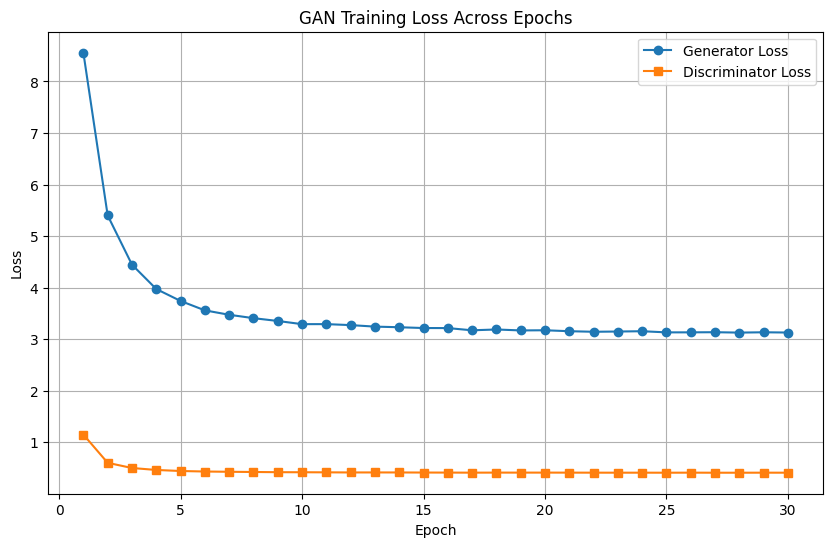

In [77]:
import matplotlib.pyplot as plt


epochs = range(1, 31)

plt.figure(figsize=(10,6))

plt.plot(epochs, g_losses, marker='o', label="Generator Loss")
# plt.yscale("log")
plt.plot(epochs, d_losses, marker='s', label="Discriminator Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("GAN Training Loss Across Epochs")
plt.legend()
plt.grid(True)

plt.savefig("gan_loss_curve.png", dpi=300, bbox_inches="tight")

plt.show()

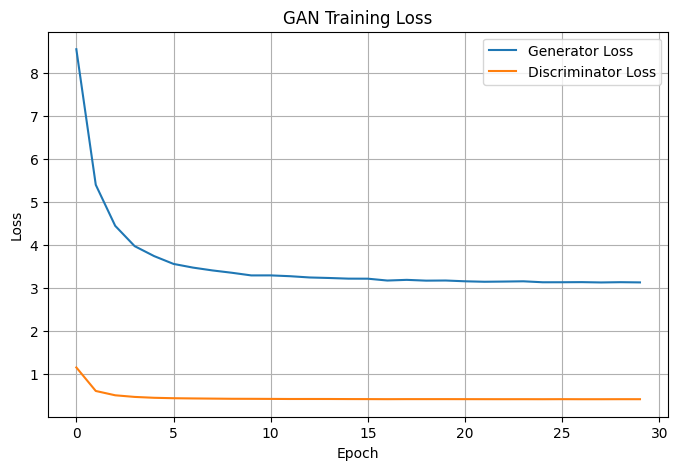

In [78]:
plt.figure(figsize=(8,5))
plt.plot(g_losses, label="Generator Loss")
plt.plot(d_losses, label="Discriminator Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("GAN Training Loss")
plt.legend()
plt.grid(True)
plt.show()

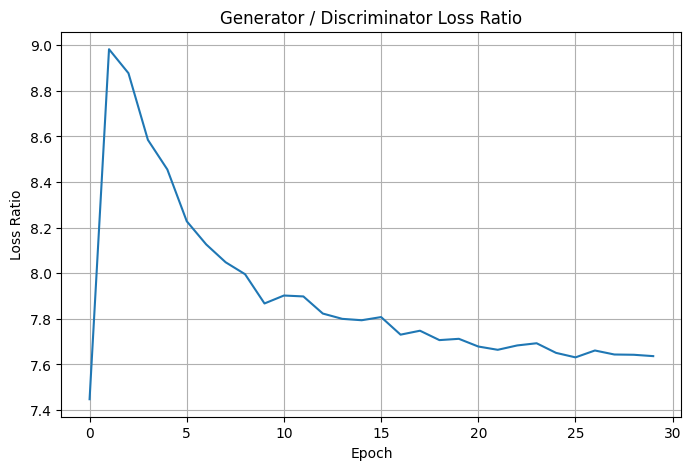

In [79]:
ratio = np.array(g_losses) / np.array(d_losses)

plt.figure(figsize=(8,5))
plt.plot(ratio)
plt.title("Generator / Discriminator Loss Ratio")
plt.xlabel("Epoch")
plt.ylabel("Loss Ratio")
plt.grid(True)
plt.show()

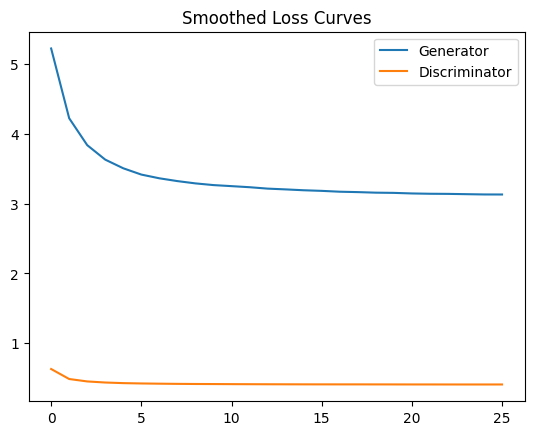

In [80]:
def moving_avg(x, k=5):
    return np.convolve(x, np.ones(k)/k, mode='valid')

plt.plot(moving_avg(g_losses), label="Generator")
plt.plot(moving_avg(d_losses), label="Discriminator")

plt.legend()
plt.title("Smoothed Loss Curves")
plt.show()

In [81]:
import os
import cv2
import numpy as np

output_dir = "gan_enhanced_results"
os.makedirs(output_dir, exist_ok=True)

print("Generating GAN enhanced images...")

for i, low_light in enumerate(train_ds.take(500)):

    prediction = unet_iam(low_light, training=False)

    pred_img = prediction[0].numpy()
    pred_img = np.clip(pred_img, 0, 1)
    pred_img = (pred_img * 255).astype("uint8")

    save_path = os.path.join(output_dir, f"gan_img_{i}.png")
    cv2.imwrite(save_path, pred_img)

print("GAN enhanced images saved.")

Generating GAN enhanced images...
GAN enhanced images saved.


In [84]:
unet_iam.save_weights("/content/drive/MyDrive/Colab Notebooks/final_colab_unet_iam.weights.h5")
unet_iam.save("/content/drive/MyDrive/Colab Notebooks/final_colab_unet_iam.h5")
# enlighten_gan.save("/content/drive/MyDrive/Colab Notebooks/final_enlighten_gan_model.h5")
enlighten_gan.generator.save_weights("/content/drive/MyDrive/Colab Notebooks/final_generator.weights.h5")
enlighten_gan.global_disc.save_weights("/content/drive/MyDrive/Colab Notebooks/final_global_discriminator.weights.h5")
enlighten_gan.local_disc.save_weights("/content/drive/MyDrive/Colab Notebooks/final_local_discriminator.weights.h5")
enlighten_gan.generator.save_weights("/content/drive/MyDrive/Colab Notebooks/final_enlightengan_final.weights.h5")